In [93]:
import sys
from datetime import datetime
import tracemalloc
import pdb
import os
import ipynbname
import gc
import glob
import ast
import traceback
import time
import shutil

#math
import math
import re
import itertools
import ast
import csv
import numpy as np
import pandas as pd
import seaborn as sns
import collections
from collections import Counter, defaultdict

#JSON output
import json
import IPython
from IPython.display import display, JSON

#graph
import networkx as nx
from graphviz import Digraph
from IPython.display import display, JSON
from scipy import stats

#plots
import matplotlib.pyplot as plt
import matplotlib
import matplotlib.image as mpimg
import matplotlib.cm as cm
import matplotlib.colors as mcolors
import matplotlib.patches as mpatches

#packages for Persistence Topology analysis
import plotly.tools as tls
import plotly.graph_objects as go
import plotly.io as pio
from mpl_toolkits.mplot3d import Axes3D
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
from gudhi import RipsComplex, SimplexTree
import gudhi

print('sys verson = ' + sys.version)
print('IPython verson = ' + IPython.__version__)

%matplotlib inline
my_client = fbl.get_client()

sys verson = 3.9.16 | packaged by conda-forge | (main, Feb  1 2023, 21:39:03) 
[GCC 11.3.0]
IPython verson = 8.14.0


In [20]:
#turn on breakpoints?
%pdb on

Automatic pdb calling has been turned ON


# Github

In [10]:
!git init
!git remote add origin https://github.com/sgarnell/archive

Reinitialized existing Git repository in /home/ffbo/ffbo/.git/
fatal: remote origin already exists.


In [9]:
!git remote -v

origin	https://github.com/sgarnell/archive.git (fetch)
origin	https://github.com/sgarnell/archive.git (push)


In [92]:
# Stage the notebook file
!git add 'hemibrain_dataset.ipynb'

# Commit the changes
!git commit -m "Auto commit from Jupyter for {notebook_name}"

# Push to GitHub
!git push origin main  # Replace 'main' with 'master' if needed

[main ddf75da] Auto commit from Jupyter for {notebook_name}
 1 file changed, 118 insertions(+), 123 deletions(-)
Enumerating objects: 5, done.
Counting objects: 100% (5/5), done.
Delta compression using up to 16 threads
Compressing objects: 100% (3/3), done.
Writing objects: 100% (3/3), 2.27 KiB | 2.27 MiB/s, done.
Total 3 (delta 2), reused 0 (delta 0)
remote: Resolving deltas: 100% (2/2), completed with 2 local objects.
To https://github.com/sgarnell/archive.git
   98feb63..ddf75da  main -> main


# Initialize

In [21]:
data = my_client.executeNLPquery('clear')

[FBL NLP 2025-06-19 23:45:22,547] NLP successfully parsed query.


In [22]:
import neuroarch.version
print(neuroarch.version.__version__)

0.4.3


In [23]:
#Neurmorphology and Simulation
import neuroarch.na as na
dbDataset = na.NeuroArch("hemibrain",port=2424) #create connection to flywire

# Optional

In [12]:
data = my_client.executeNLPquery("add $APL_R_1$")

[FBL NLP 2025-06-18 21:00:00,886] NLP successfully parsed query.


In [11]:
# Query to retrieve sample records from the Neuropil class
query = "SELECT * FROM MetaData LIMIT 100"  # Adjust the limit as needed
metadata_records = dbDataset.sql_query(query)


if len(metadata_records) == 0:
    print("No records found in the 'metaData' class.")
else:
    print("Sample records in 'metaData' class:")
    for record in metadata_records:
        # Print the ID and the properties of each record
        print(f"version: {record.version}, registryname: {  record.props }")
        #print(str(record.))
        # Synonyms: {record.get_props['synonyms']}


Sample records in 'metaData' class:
version: 2.0.1, registryname: {'created_by': {'min_NeuroArch_version_supported': '0.4.1', 'created_date': '2022-06-18T02:10:08.724498', 'NeuroArch_version': '0.4.0', 'OrientDB_version': '3.1.17'}, 'maintainer': {'name': 'Yiyin Zhou', 'email': 'yiyin@ee.columbia.edu'}, 'version': '2.0.1'}


In [ ]:
# Query to retrieve all class types in the OrientDB database
query = "SELECT name FROM (SELECT expand(classes) FROM metadata:schema)"
class_types = dbDataset.sql_query(query)

if len(class_types) == 0:
    print("No class types found in the database.")
else:
    # Store class names in a list
    class_names = [class_type.name for class_type in class_types]

    # Sort the list alphabetically
    sorted_class_names = sorted(class_names)

    # Print the sorted list
    for class_name in sorted_class_names:
        print(class_name)


In [39]:
####Total Schema #######
def get_class_metadata(className, client, visited=None):

    tempMetaData = {}
    # Query to retrieve sample records from the Neuropil class
    query = f"SELECT * FROM {className} LIMIT 1"  # Adjust the limit as needed
    class_records = client.sql_query(query)
    for record in class_records:
        tempMetaData[className] = str(record._props)
    #print(f"ID: {record._id}, Name: {record._props['name']}, Synonyms: {record._props['synonyms']}")
    
    if not tempMetaData:
        return {}

    return tempMetaData

def get_full_metadata(client):
    
    #clear dicts
    metadata_dict = {}
    query = "SELECT name FROM (SELECT expand(classes) FROM metadata:schema)"
    class_types = client.sql_query(query)
    #list of names
    class_names = [class_type.name for class_type in class_types]
    for className in class_names:
        classProps = get_class_metadata(className, client)
        metadata_dict[className] = classProps
    return metadata_dict #return dict

# Connect to the database

# Get metadata and save to JSON
metadata_dict = get_full_metadata(dbDataset)

with open("metadata_tree.json", "w") as f:
    json.dump(metadata_dict, f, indent=4)

print("Metadata saved to metadata_tree.json")


Metadata saved to metadata_tree.json


In [ ]:


# Query to retrieve sample records from the Neuropil class
query = "SELECT * FROM Neuropil LIMIT 100"  # Adjust the limit as needed
neuropil_records = dbDataset.sql_query(query)

if len(neuropil_records) == 0:
    print("No records found in the 'Neuropil' class.")
else:
    print("Sample records in 'Neuropil' class:")
    for record in neuropil_records:
        # Print the ID and the properties of each record
        print(f"ID: {record._id}, Name: {record._props['name']}, Synonyms: {record._props['synonyms']}")


In [ ]:
neuropil_name = "MB(R)"
neuropil = dbDataset.sql_query(""" select from Neuropil where name = "{}" """.format(neuropil_name)) 
neurons = neuropil.gen_traversal_in(['ArborizesIn', 'Neuron'], min_depth = 1) 
celltype_names = list(np.unique([neuron.name for neuron in neurons.node_objs]))
# print(celltype_names)

import itertools

maxLoop = 10  # Change this to your desired number of lines
for neuron in itertools.islice(neurons.node_objs, maxLoop):
    print(neuron._props['name'])
    
    
print(neuron._props)

In [14]:
#Sample of neuron syanpse for --OUT-- traversal synapses

neuron_name = "DPM"
q = dbDataset.sql_query(""" select from Neuron where name = "{}" """.format(neuron_name)) 

prepost_synapse_morph  = q.gen_traversal_out(
                                ['SendsTo', 'Synapse'],
                                ['HasData', 'MorphologyData'],
                                min_depth = 2)

maxLoop = 2  # Change this to your desired number of lines
for synData in itertools.islice(prepost_synapse_morph.node_objs, maxLoop):
    display(JSON(synData._props))

    
    

<IPython.core.display.JSON object>

<IPython.core.display.JSON object>

In [15]:
#Sample of neuron syanpse for --IN-- traversal synapses

#neuron_name = "DPM" See Above cell where this is set
neurons = dbDataset.sql_query(""" select from Neuron where name = "{}" """.format(neuron_name)) 
prepost_synapse_morph  = neurons.gen_traversal_in(
                        ['SendsTo', 'Synapse'],
                        min_depth = 1).gen_traversal_out(
                        ['HasData', 'MorphologyData'],
                        min_depth = 1)

maxLoop = 2  # Change this to your desired number of lines
for synData in itertools.islice(prepost_synapse_morph.node_objs, maxLoop):
    display(JSON(synData._props))

    
    

<IPython.core.display.JSON object>

<IPython.core.display.JSON object>

In [ ]:
# Inspect the attributes and methods of the first neuron object
first_neuron = neurons.node_objs[0]
neuronData = first_neuron.out('HasData')
print(dir(first_neuron))

# Optionally, print the properties to see their values
print(first_neuron.__dict__)
print(first_neuron._id)
print(first_neuron.name)

print('---------')
outgoing_synapses = first_neuron.out('SendsTo')
for synapse in outgoing_synapses: # Check the properties of the synapse 
    synapse_props = synapse.get_props()
print(synapse_props)
print('neuroTransmitterList')


# Check if neuronData is not empty and contains valid objects
if neuronData:
    # Access the first ArborizationData object
    arborization_data = neuronData[0]

    # Access the 'Transmitters' property of the ArborizationData object
    neuronTransmitterList = arborization_data.props.get('Transmitters', None)
    
    print(neuronTransmitterList)
else:
    print("No data available for the neuron.")


## ----------
# Start Here
## ----------

In [24]:
neuron_name = "DPM"
neurons = dbDataset.sql_query(""" select from Neuron where name = "{}" """.format(neuron_name)) 

maxLoop = 10  # Change this to your desired number of lines
for neuron in itertools.islice(neurons.node_objs, maxLoop):
    print(neuron._props['name'])
    
    
print(neuron._props)

DPM
DPM
{'uname': 'DPM_R_1', 'name': 'DPM', 'referenceId': '5813105172', 'info': {'Hemibrain Trace Status': 'Roughly traced'}}


In [25]:
#Supporting routine to locate post and pre synapses

def locate_psd(q, prob = 0.0, cell_type = False, travIn = True):
    
    if travIn == True:
        prepost_synapse_morph  = q.gen_traversal_in(
                                ['SendsTo', 'Synapse'],
                                min_depth = 1).gen_traversal_out(
                                ['HasData', 'MorphologyData'],
                                min_depth = 1)
    else:
         prepost_synapse_morph  = q.gen_traversal_out(
                                ['SendsTo', 'Synapse'],
                                ['HasData', 'MorphologyData'],
                                min_depth = 2)
    
    x = []
    y = []
    z = []
    names = []
    neuron_ind = []
    for i, n in enumerate(prepost_synapse_morph):
        
        # pre = presynaptic_neuron_uname(n.uname)
        if travIn == True:
            synName = n.uname.split('--',1)[0]
        else:
            synName = n.uname.split('--',1)[1]
            
        names.append(synName)
        n_syn = len(n.x)//2
        try:
            if len(n.confidence):
                conf = [a >= prob and b >= prob for a, b in zip(n.confidence[:n_syn], n.confidence[n_syn:])]
            elif len(n.confidence) == n_syn:
                conf = [a >= prob for a in n.confidence]
            else:
                raise ValueError()
            x.extend([v for v, c in zip(n.x[n_syn:], conf) if c])
            y.extend([v for v, c in zip(n.y[n_syn:], conf) if c])
            z.extend([v for v, c in zip(n.z[n_syn:], conf) if c])
            neuron_ind.extend([i] * sum(conf))
        except:
            x.extend(n.x[n_syn:])
            y.extend(n.y[n_syn:])
            z.extend(n.z[n_syn:])
            neuron_ind.extend([i] * n_syn)
    psd = {(x[i], y[i], z[i]): names[neuron_ind[i]] for i in range(len(x))}
    return psd

In [ ]:
#Here we make the psds dict that contains all synaptic points
#neuron_name = "DPM" See Above cell where this is set
neuronQuerry = dbDataset.sql_query(""" select from Neuron where name = "{}" """.format(neuron_name)) 
print(f"Records for Query = {len(neuronQuerry)}")

psds = {}
psdCumulative = {}
psdNew = {}
nuronsFromQeury = []

maxLoop = 10  # Change this to your desired number of lines
print(f"\033[32m Gathering Synaptic data for \033[38;2;255;165;0m {maxLoop} \033[32m neurons in query.\033[0m")
print('', sep="\n\n")

      
for neuron in itertools.islice(neuronQuerry.node_objs, maxLoop):
    
    #print(neuron.__dict__)
    currUname = neuron._props['uname']
    currName = neuron._props['name']
    print(f'\033[32m Getting synapese for Neuron uname= \033[38;2;255;165;0m {currUname}\033[0m')
    #print(f"Getting synapses for Neuron uname={currUname}, name={currName}")                                                         
    nuronsFromQeury.append(currName)
    
    neuronData = neuron.out('HasData')
    print(neuronData)
    
    print('---------')
    psdsNew = {}
    
    q = neuronQuerry.from_objs(dbDataset.graph, [neuron])
    # #########SET Pre or Post Connectivity#########
    getIncomingSynapses = False
    # ##############################################
    
    psdsNew = locate_psd(q,travIn = getIncomingSynapses)
    
    counter = Counter(psdsNew.values())
    result = {label: count for label, count in counter.items()}
    update_count = sum(result.values())
    print(f"\033[32m Combining PSDs: \033[38;2;255;165;0m {update_count} \033[32m new synapses added \033[0m \n")
    psdCumulative.update(psdsNew) #combine dicts but raise error if duplicates exist

#set psds with the final results    
psds = psdCumulative

counter = Counter(psds.values())    
result = {label: count for label, count in counter.items()}
total_count = sum(result.values())
sorted_results = sorted(result.items(), key=lambda x: x[1], reverse=True)
print(f"\033[32m Total Number of Synapses found = \033[95m {total_count} \033[0m \n")
print('PSDS Dict:')
display(JSON(psds))

#Print out PSDS

allKeys = list(psds.keys())
bad_keys = []

# Check for uniformity: expecting all keys to be 3-element tuples
for k in allKeys:
    if not (isinstance(k, tuple) and len(k) == 3 and all(isinstance(i, (int, float)) for i in k)):
        bad_keys.append(k)

if bad_keys:
    print(f"Found {len(bad_keys)} problematic keys:")
    for i, bk in enumerate(bad_keys[:10]):  # Show only first 10 for brevity
        print(f"{i+1}: {bk} (type: {type(bk)})")
    print("Use dtype=object to avoid this error or clean the keys.")
    point_cloud_list = np.array(allKeys, dtype=object)
else:
    #point_cloud_list = np.array(list(psds.keys()))
    point_cloud_list = np.array(allKeys)




print("Unique Labels and Their Counts:")
display(JSON(sorted_results))


# Extract the points from the dictionary


#print(point_cloud_list)

In [ ]:
#Plot the Synapses


# Returns a list of labels from the input NumPy array that start with the given prefix.
def filter_labels_by_prefix(label_array, prefix):
    """
    Parameters:
        label_array (np.ndarray): Array of string labels.
        prefix (str): The string prefix to filter by.
    """
    return [label for label in label_array if label.startswith(prefix)]





#A function def to enerate the psds point cloud graph
def visualize_synapses(example_synapses_data,
                       show_labels=True,
                       colormap=g_colormap,
                       labels_array=g_labels_array,
                       unique_labels=g_unique_labels,
                       cutOff=g_labelCutoff
                      ):
    
    
    total_items = len(example_synapses_data)

    
    #create text for graph naming
    if getIncomingSynapses:
        inOutLabel = 'incoming'
    else:
        inOutLabel = 'outgoing'

    
    # Create the 3D scatter plot
    #plt.ion()  
    fig = plt.figure(figsize=(15,30))
    ax = fig.add_subplot(111, projection='3d')

    # Set background color to black
    ax.set_facecolor('black')
    fig.patch.set_facecolor('black')
    ax.grid(color='cyan')

    # Get colormap object
    #cmap = plt.get_cmap(colormap)
    cmap =  matplotlib.colormaps[colormap]


    print(f"Total items to process: {total_items}")

    try:
        # Convert dictionary keys and values to NumPy arrays for vectorized operations
        keys_array = np.array([list(key) for key in example_synapses_data.keys()])

        
        
        # Validate coordinates (ensure all are non-negative floats)
        if np.any(keys_array < 0):
            raise ValueError("Invalid coordinate detected")

        x_coords, y_coords, z_coords = keys_array.T  # Efficient unpacking

        # Generate label colors using hashing while respecting cutoff logic
        hash_values = np.array([hash(label) % 256 for label in unique_labels])  # Keep consistent hash assignment
        colors = cmap(hash_values / 255)  # Normalize hash index for colormap mapping

        # Scatter plot using vectorized inputs
        ax.scatter(x_coords, y_coords, z_coords, c=colors[label_indices], s=10, alpha=0.7)
        

        # Periodic progress updates (every 10%)
        for progress in np.linspace(10, 100, 10, dtype=int):  
            if total_items * (progress / 100) <= len(x_coords):
                print(f"Processed {progress}% of total items")

        # Set labels and colors
        ax.set_xlabel('X Coordinates', color='cyan')
        ax.set_ylabel('Y Coordinates', color='yellow')
        ax.set_zlabel('Z Coordinates', color='orange')

        ax.tick_params(axis='x', colors='cyan')
        ax.tick_params(axis='y', colors='yellow')
        ax.tick_params(axis='z', colors='orange')
        
        plt.title(f'3D {inOutLabel} Synapses for {neuron_name}', 
                fontsize=18,           # Increase font size
                fontweight='bold',      # Make text bold
                color='magenta')      # Change title color

        #nuronsFromQeury

        # Add text labels if needed
        if show_labels:
            for i in range(len(x_coords)):
                ax.text(x_coords[i], y_coords[i], z_coords[i], f"Label: {labels_array[i]}", size=10, color='black', ha='center')

                
                
        # Normalize color indices across unique labels
        norm = mcolors.Normalize(vmin=min(label_indices), vmax=max(label_indices))  # Use full dynamic range
        
        # Create a dictionary mapping labels to colors
        label_colors = {label: mcolors.to_hex(cmap(norm(i))) for i, label in enumerate(unique_labels)}
        # Create legend entries using unique labels
        legend_patches = [mpatches.Patch(color=label_colors[label], label=label) for label in unique_labels]
        # Add the legend to the plot
        ax.legend(handles=legend_patches,
                  handlelength=2,
                  #loc='lower left',
                  bbox_transform=fig.transFigure,
                  bbox_to_anchor=(0.4, 0.4), 
                  fontsize=8, 
                  title="Synapse Types",
                  frameon=True, 
                  columnspacing=0.5,
                  handletextpad=0.5,
                  framealpha=1.0,
                  facecolor='lightgray',
                  ncol=6)

        numLabels = len(legend_patches)
        print(f"Short List of {numLabels} {inOutLabel} Synapses for {neuron_name}")
        
        # Ensure interactive mode is enabled
        plt.tight_layout()  # Automatically prevents label cutoff without shrinking
        plt.show()
        # Convert Matplotlib figure to Plotly


        # Save as interactive HTML
        # Convert data into a proper Plotly 3D scatter plot
        cmapPlotly = matplotlib.colormaps[colormap]
        
        # Convert colors **without discretizing** (keeps smooth color variations)
        #plotly_colors = [cmap(norm(i))[:3] for i in label_indices]  # Extract RGB (without alpha)
        # Convert labels into **a numeric color range**
        plotly_color_values = [norm(i) for i in label_indices]  # Normalize for full variation
        
        # Map unique labels to colors for use in the interactive version
        legend_colors = [mcolors.to_hex(cmapPlotly(norm(i))) for i in range(len(unique_labels))]
        

        # Create Plotly scatter plot with correct colors
        plotly_fig = go.Figure(data=[go.Scatter3d(
            x=x_coords,
            y=y_coords,
            z=z_coords,
            mode='markers',
            marker=dict(size=5,
                        color=plotly_color_values,
                        colorscale=colormap,
                        opacity=0.7)  # Use hex colors
        )])
        
        
        
        # **Add a legend trace for each synapse
        # This allows you to see a popup when you hover over
        # a single synapse
        labels = [unique_labels[i] for i in label_indices]  # Ensure every synapse has a corresponding label
        plotly_fig = go.Figure(data=[go.Scatter3d(
            x=x_coords,
            y=y_coords,
            z=z_coords,
            mode='markers',
            marker=dict(
                size=5,
                color=[label_colors[label] for label in labels],  # Use mapped colors correctly
                opacity=0.7
            ),
            text=labels,  # Synapse label in hover text
            hoverinfo="text+x+y+z"
        )])
        
        plotly_fig.update_layout(
            scene=dict(
                bgcolor="black",  # Set the 3D plot background to black
                xaxis=dict(
                    showbackground=True,
                    backgroundcolor="black",  # Match plot background
                    gridcolor="darkgray",  # Darker grid lines
                    zerolinecolor="dimgray",
                    showspikes=False,
                    gridwidth=0
                ),
                yaxis=dict(
                    showbackground=True,
                    backgroundcolor="black",
                    gridcolor="darkgray",
                    zerolinecolor="dimgray",
                    showspikes=False,
                    gridwidth=0
                ),
                zaxis=dict(
                    showbackground=True,
                    backgroundcolor="black",
                    gridcolor="darkgray",
                    zerolinecolor="dimgray",
                    showspikes=False,
                    gridwidth=0
                )
            ),
            paper_bgcolor="black",
            font=dict(color="white")  # White text for readability
        )

        #this adds a color legend on the side of the graph
        for label in unique_labels:
            plotly_fig.add_trace(go.Scatter3d(
                x=[None],  # Dummy point (doesn't affect the plot)
                y=[None],
                z=[None],
                mode='markers',
                marker=dict(size=10, color=label_colors[label]),
                name=label  # Displays label in the legend
            ))

        
        
        pio.write_html(plotly_fig, "synapse_plot.html", auto_open=False)

            
            
        
    except Exception as e:
        print(f"An error occurred:\n{traceback.format_exc()}")


visualize_synapses(psds, show_labels=False, colormap=g_colormap,labels_array=g_labels_array,unique_labels=g_unique_labels)

# 'viridis' (default)
# plasma
# 'inferno'
# 'magma'
# 'cividis'
# 'coolwarm'

Total items to process: 76727
Processed 10% of total items
Processed 20% of total items
Processed 30% of total items
Processed 40% of total items
Processed 50% of total items
Processed 60% of total items
Processed 70% of total items
Processed 80% of total items
Processed 90% of total items
Processed 100% of total items
Short List of 244 outgoing Synapses for DPM


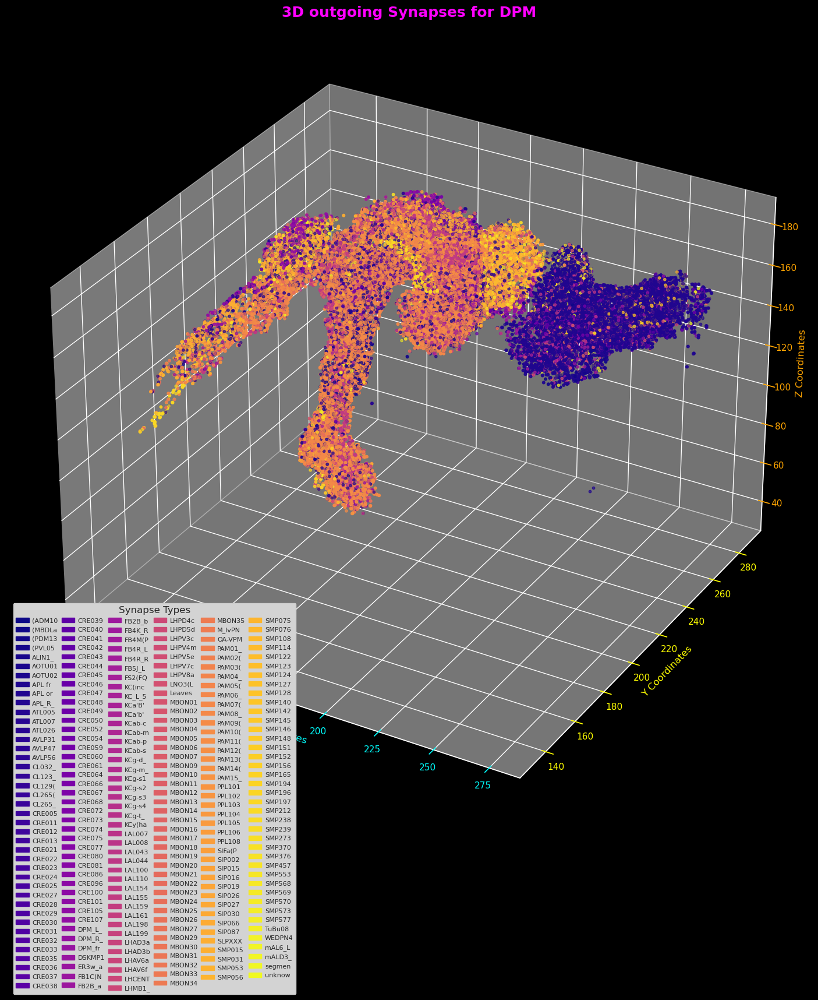

In [111]:
#Logic to handle a full dict of all subtypes
#Declare Globals for reuse later
g_labelCutoff = 6
g_labels_array = np.array([label[:g_labelCutoff] for label in psds.values()])  # Apply cutoff
g_unique_labels, label_indices = np.unique(g_labels_array, return_inverse=True)
# print('Unique Labels for Each Neuron Type:')
#print(g_unique_labels)
# pdb.set_trace()
# Plotting points with their corresponding labels
# 'viridis' (default)
# plasma
# 'inferno'
# 'magma'
# 'cividis'
# 'coolwarm'
g_colormap='plasma'
cmap = plt.colormaps[g_colormap] # Get the colormap object
#Standard Pointcloud for all synapses associated with a primary neuron
visualize_synapses(psds, 
                   show_labels=False, 
                   colormap=g_colormap,
                   labels_array=g_labels_array,
                   unique_labels=g_unique_labels
                  )

Total items to process: 32338
Processed 10% of total items
Processed 20% of total items
Processed 30% of total items
Processed 40% of total items
Processed 50% of total items
Processed 60% of total items
Processed 70% of total items
Processed 80% of total items
Processed 90% of total items
Processed 100% of total items
Short List of 255 outgoing Synapses for DPM


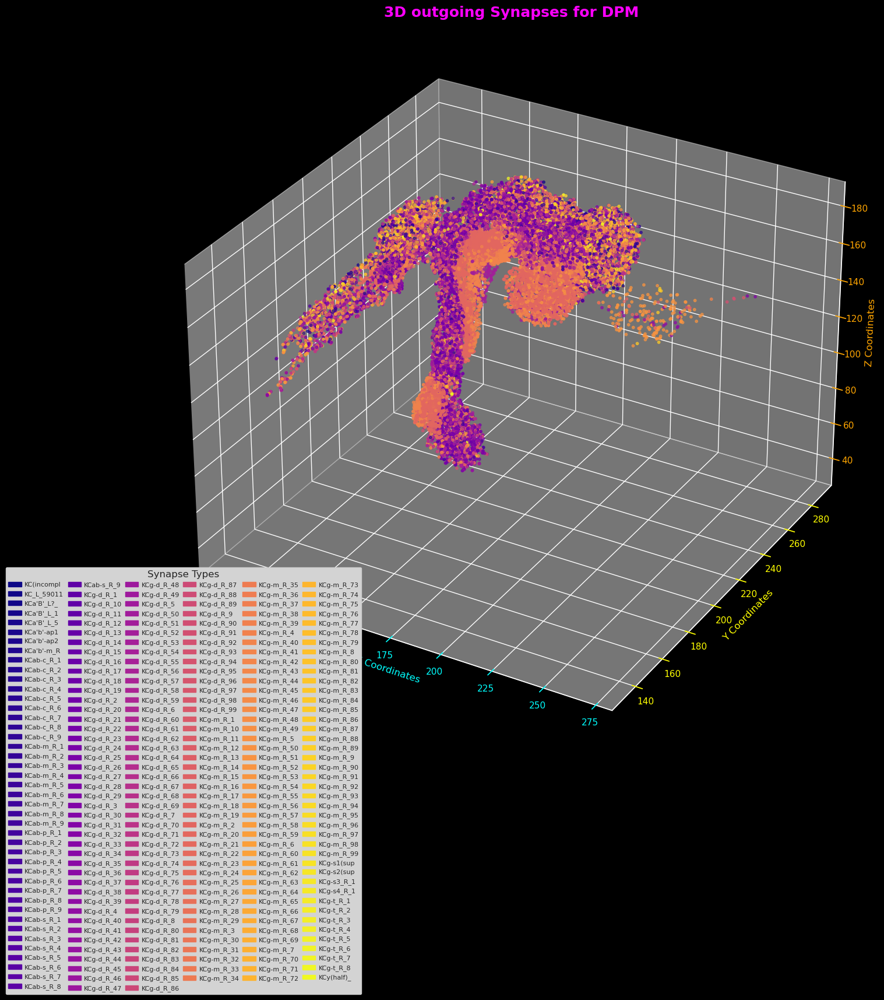

In [110]:
#Logic to handle a SUBSET dict that includes only specified subtype with longer lables
#Declare Globals for reuse later
labelPrefix = 'KC'
#Filter out all points from the PSDS dict that have values that start with the labelPrefix
filtered_psds = { key: value for key, value in psds.items() if value.startswith(labelPrefix) }
g_labelCutoff = 10
g_labels_array = np.array([label[:g_labelCutoff] for label in filtered_psds.values()])  # Apply cutoff
g_unique_labels, label_indices = np.unique(g_labels_array, return_inverse=True)
g_subset_labels = filter_labels_by_prefix(g_unique_labels, labelPrefix)



g_colormap='plasma'
cmap = plt.colormaps[g_colormap] # Get the colormap object

#Standard Pointcloud for all synapses associated with a primary neuron
visualize_synapses(filtered_psds,
                   show_labels=False,
                   colormap=g_colormap,
                   labels_array=g_labels_array,
                   unique_labels=g_subset_labels)

In [102]:
# Point Cloud Total Statistical Count

psdDict = {key: value for key, value in psds.items()}
counter = Counter(psdDict.values())    
result = {label: count for label, count in counter.items()}
total_count = sum(result.values())
sorted_results = sorted(result.items(), key=lambda x: x[1], reverse=True)

#create text for graph naming
if getIncomingSynapses:
    inOutLabel = 'incoming'
else:
    inOutLabel = 'outgoing'

print(f'PSD Dictionary for {inOutLabel} Synapses of {neuron_name} neuron')
display(JSON(sorted_results))


PSD Dictionary for outgoing Synapses of DPM neuron


<IPython.core.display.JSON object>

In [29]:
# Create JSON for all subDict objects based on Label patch
# Create a file and store the current set of subDict synapses

# Function to make sure all dictionary keys are JSON-compliant
def sanitize_dict(d):
    return {str(k): v for k, v in d.items()}  # Convert keys to strings


listOfSubDicts = []
for i, neuronType in enumerate(g_unique_labels[:500]):
    #subDictFilter = "PPL105(a'2a2)_R_1"
    subDictFilter = neuronType
    subDict = {key: value for key, value in psds.items() if subDictFilter in value}
    listOfSubDicts.append(subDict)

total_count = len(listOfSubDicts)
print(f"Total number of of subdictionairies = {total_count}")

#Make a list that can be printed out as a JSON
sanitized_list = [sanitize_dict(subdict) for subdict in listOfSubDicts]

# dictFilename = inOutLabel + '_' + neuron_name + '_synapses.json'
# with open(dictFilename, "w") as f:
#     json.dump(sanitized_list, f, indent=4)

#print(g_unique_labels)   
    
# labeFilename = inOutLabel + '_' + neuron_name + '_labels.json'
# with open(labeFilename, "w") as f:
#     json.dump(g_unique_labels, f, indent=4)

#print(json.dumps(sanitized_list, indent=4)) 
display(JSON(sanitized_list))



# Define the file path and key name for the list
local_file_for_subDict = 'subDictsByNeuron.json'
subDictTypeKeyName = neuron_name + '_' + inOutLabel

# Check if the JSON file exists
if not os.path.isfile(local_file_for_subDict):
    # Create a new JSON object with an empty list for the key
    json_data = {subDictTypeKeyName: []}
else:
    # Open the existing JSON file and load it into a variable
    with open(local_file_for_subDict, 'r') as f:
        json_data = json.load(f)

# Check if the new list already exists in the JSON object
if subDictTypeKeyName not in json_data or len(json_data[subDictTypeKeyName]) == 0:
    # Append the new list to the JSON object
    json_data[subDictTypeKeyName] = []
    print(f"Adding new Key of {subDictTypeKeyName} to {local_file_for_subDict} ")
    json_data[subDictTypeKeyName].append(sanitized_list)
    json_data[subDictTypeKeyName].append(g_unique_labels.tolist())
else:
    print(f"Key {subDictTypeKeyName} already found in file.")

# Save the updated JSON object to the file
with open(local_file_for_subDict, 'w') as f:
    json.dump(json_data, f)


Total number of of subdictionairies = 244


<IPython.core.display.JSON object>

Key DPM_outgoing already found in file.


In [19]:
# pio.renderers.default = "svg"  # Switch from 'notebook' or 'iframe

In [114]:
# Extract the points from the dictionary



# # Open the JSON file for reading
# # with open(local_file_for_subDictLabls, 'r') as f:
# def convert_keys_to_tuples(d):
#     """Convert string representation of tuples back into actual tuple keys."""
#     return {ast.literal_eval(k): v for k, v in d}

# This is a routine to extract all the data from the file that matches a particular neuron type
def get_keys_containing_value(json_data, value):
    matching_keys = []
    for key in json_data.keys():
        if value in key or key.startswith(value):  # Check both ways (in and startswith)
            matching_keys.append(key)
            
    return matching_keys



def process_synapse_diagrams(
    singleTypeDictData,
    json_data,
    minSynapticCount=200,
    maxSynapticCount=2000,
    maxLimit=10,
    max_edge_length=8.0,
    max_dimension=3,
    output_dir="persistence_diagrams",
    save_outliers=True,
    file_name_prefix = 'unknow'):
    
    
    #format and print out the over and undersized datasets
    def format_labels_as_columns(label_keys, columns=6, width=3):
        labels = list(label_keys)
        lines = [
            '  '.join(f"{label:<{width}}" for label in labels[i:i+columns])
            for i in range(0, len(labels), columns)
        ]
        return '\n'.join(lines)
    
    
    #There should be two sets of data per Neuron Type
    # Incomeing and Outgoing
    # So we will loop over both types and generate graphs
    for item in singleTypeDictData:

        print(f"\033[32m Processing \033[38;2;255;165;0m {item} \033[32m synapses")
        #because the order of data in the source file is not guaranteed
        #we need to determine if the in/out status of the first set
        inOutDataListIndex = 0 if item.find('incoming') != -1 else 1
        # Extract only the section that matches subDictTypeKeyName
        filtered_data = json_data.get(singleTypeDictData[inOutDataListIndex], [])

        _subDictList = []
        _subDictListScrubbed = [] #a list that will contain only the dicts for final analysis
        _subDictOversized = {}
        _subDictUndersized = {}
        outsideBoundDataToSave = {}


        # Here we do two things:
        # 1. The list in filtered_data contains the main dict and a secondar dict
        # Main contains the point cloud data
        # The second object is a dict of unique label names for each type of neuron
        # 2. For each synaptic group by neuron type, we need to loop through and convert the
        # Pointcloud xyz from string to tuples
        # ############################################################################
        # minSynapticCount = 200 #min number of synaptic points to keep for processing
        # maxSynapticCount = 2000 #max number of synaptic points to processing
        # ############################################################################
        #Remove all Dictionaries with synapses out of range for calculations
        #Note above min and max numbers
        for i, oneNeuronTypeDict in enumerate(filtered_data[0]):
            if len(oneNeuronTypeDict) <= minSynapticCount: #too small
                _subDictUndersized[filtered_data[1][i]] = oneNeuronTypeDict
                #pdb.set_trace()
                continue
            if len(oneNeuronTypeDict) >= maxSynapticCount: #too big
                #Keep the large syanptic group for latter processing
                _subDictOversized[filtered_data[1][i]] = oneNeuronTypeDict
                #pdb.set_trace()
                continue
            else:
                _subDictListScrubbed.append(oneNeuronTypeDict) #juuuuust right


        temp_list = [] #a list to hold data to be eventually saved in json dump flies

        if save_outliers:
            #WE now save data that is both above and below the caculatible range
            temp_list.extend([_subDictUndersized, _subDictOversized])
            outsideBoundDataToSave[item] = temp_list
            filenameForSave = f"{item}_outsideBoundData.json"
            with open(filenameForSave, 'w') as f:
                json.dump(outsideBoundDataToSave, f)


        for oneDictObject in _subDictListScrubbed: 
            _tuppleConvertedDict = {ast.literal_eval(k): v for k, v in oneDictObject.items()}
            _subDictList.append(_tuppleConvertedDict)


        persitanceDiagram_fig_list = []    

        # #memory trace for debugging
        # tracemalloc.start()
        # snapshot1 = tracemalloc.take_snapshot()


            # print(f'sample of converted data: {converted_data[:2]}')
            # # parse the string keys safely and convert them back into tuples using ast.literal_eval, 
            # # which correctly interprets tuple-like strings:
            # # subDict_converted_data = [convert_keys_to_tuples(d) for d in filtered_data]  # Convert each dictionary in the list
        for i, oneNeuronTypeDict in enumerate(_subDictList):

            #NOTE: Since we have already scurbbed the data, the following if statements are redundant
            #However, they ar left here just in case.
            if len(oneNeuronTypeDict)  <= minSynapticCount:
                print(f"\033[32m Skipping \033[38;2;255;165;0m {filtered_data[1][i]} \033[32m because length is under {len(oneNeuronTypeDict)} \033[0m synapses")
                pdb.set_trace()
                continue  # Skip further execution and move to the next iteration

            if len(oneNeuronTypeDict)  >= maxSynapticCount:
                print(f"\033[32m Skipping \033[38;2;255;165;0m {filtered_data[1][i]} \033[32m because length is over {len(oneNeuronTypeDict)} \033[32m synapses \033[0m")
                continue  # Skip further execution and move to the next iteration

            # #######################
            # maxLimit = 10 #max number of times to loop
            # #######################

            if i >= maxLimit:
                print(f"\033[32m Stopping at max limit of \033[38;2;255;165;0m {maxLimit} \033[32m \n")
                break  # Exit the loop after max_iterations

            print(f"\033[32m Number of points for \033[38;2;255;165;0m {filtered_data[1][i]} \033[32m = {len(oneNeuronTypeDict)} \033[0m")
            #start_time = time.time()  # Start timer
            #print(f"\033[32m Get pointcloud for {filtered_data[1][i]}\033[0m")
            points = np.array(list(oneNeuronTypeDict.keys()))
            #end_time = time.time()  # Stop timer
            #print(f"\033[32m Execution time: \033[38;2;255;165;0m  {end_time - start_time:.4f} \033[32m seconds \033[0m\n")


            # Create a Rips complex from the point cloud
            #start_time = time.time()  # Start timer
            # max_edge_length=8.0
            #print(f"\033[32m Generate rips complex with max edge length of  \033[38;2;255;165;0m  {max_edge_length} \033[0m")
            rips_complex = RipsComplex(points=points, max_edge_length=max_edge_length)
            #end_time = time.time()  # Stop timer
            #print(f"\033[32m Execution time: \033[38;2;255;165;0m  {end_time - start_time:.4f} \033[32m seconds \033[0m\n")

            # Create a simplex tree from the Rips complex
            #start_time = time.time()  # Start timer
            # max_dimension=3
            #print(f"\033[32m Creating a simplex tree from the Rips complex using a max dimension of  \033[38;2;255;165;0m  {max_dimension}\033[0m")
            simplex_tree = rips_complex.create_simplex_tree(max_dimension=max_dimension)
            #end_time = time.time()  # Stop timer
            #print(f"\033[32m Execution time:  \033[38;2;255;165;0m {end_time - start_time:.4f} \033[32m seconds\033[0m\n")

            # Compute persistence
            #print(f"\033[32m Computue persistence for simplex tree \033[0m\n")
            #start_time = time.time()  # Start timer
            persistence = simplex_tree.persistence()
            #end_time = time.time()  # Stop timer
            #print(f"\033[32m Execution time:  \033[38;2;255;165;0m {end_time - start_time:.4f} \033[32m seconds \033[0m\n")

            # Plot using gudhi.plot_persistence_diagram
            #print(f"\033[32m Plot using gudhi.plot_persistence_diagram \033[0m")
            start_time = time.time()  # Start timer
            gudhi.plot_persistence_diagram(
                persistence,
                alpha=0.6,
                band=0.0,
                max_intervals=1000000,
                inf_delta=0.1,
                legend=True,
                fontsize=16,
                greyblock=True
            )
            #legacy code 
            #add current fig to list
            # inOutLabel = 'incoming' if inOutDataListIndex == 0 else 'outgoing' #set inOut label based on index
            # plt.title(f"Per. Diag. - Neuron Type {filtered_data[1][i]}_{inOutLabel} with {len(oneNeuronTypeDict)} synapses")  # Add custom title
            # persitanceDiagram_fig_list.append(fig)  # Store the figure for later use
            # plt.close(fig)  # Prevent auto-display inside loop
            # end_time = time.time()  # Stop timer
            # print(f"\033[32m Execution time for {filtered_data[1][i]} :  \033[38;2;255;165;0m  {end_time - start_time:.4f} \033[32m seconds \033[0m\n")

            #Label used for file names and graph title
            inOutLabel = 'incoming' if inOutDataListIndex == 0 else 'outgoing' #set inOut label based on index
            plt.title(f"Per. Diag. - Neuron Type {filtered_data[1][i]}_{inOutLabel} with {len(oneNeuronTypeDict)} synapses")  # Add custom title
            fig = plt.gcf()
            # Define the directory where you want to save figures
            # output_dir = "persistence_diagrams"
            os.makedirs(output_dir, exist_ok=True)  # This creates the folder if it doesn't exist

            # Construct the full path for the file
            filename = f"persistence_{filtered_data[1][i]}_{inOutLabel}.png"
            filepath = os.path.join(output_dir, filename)

            # Save the figure
            fig.savefig(filepath)


            #Clean up memory and force garbage collection
            plt.close(fig)  # Prevent auto-display inside loop
            del fig  # Explicitly delete variables
            gc.collect()  # Force garbage collection
            end_time = time.time()  # Stop timer
            # del fig  # Explicitly delete variables
            gc.collect()  # Force garbage collection
            end_time = time.time()  # Stop timer
            #print(f"\033[32m Execution time for {filtered_data[1][i]} :  \033[38;2;255;165;0m  {end_time - start_time:.4f} \033[32m seconds \033[0m")
            
    
    
    undersized_str = format_labels_as_columns(_subDictUndersized.keys())
    oversized_str  = format_labels_as_columns(_subDictOversized.keys())
    print(f"\033[32mThe following types are undersized:\033[0m\n\033[38;2;255;165;0m{undersized_str}\033[0m\n")
    print(f"\033[32mThe following types are oversized:\033[0m\n\033[38;2;255;165;0m{oversized_str}\033[0m\n")
        
    results = []
    
    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
    neuron_label = f"{file_name_prefix}_{timestamp}"

    #put all restults into a list for output
    results.append((points, simplex_tree, neuron_label))
    return results
        

#Get Datat to process
with open(local_file_for_subDict, 'r') as f:
    json_data = json.load(f)  # Load full JSON

neuron_type = 'DPM'

singleTypeDictData = get_keys_containing_value(json_data, neuron_type)

persitanceDiagram_results = []

persitanceDiagram_results = process_synapse_diagrams(
                                singleTypeDictData,
                                json_data,
                                minSynapticCount=200,
                                maxSynapticCount=2000,
                                maxLimit=10,
                                max_edge_length=8.0,
                                max_dimension=3,
                                output_dir="persistence_diagrams",
                                save_outliers=True,
                                file_name_prefix = neuron_type )



# print(f'\033[32m  The following types are undersized: \033[38;2;255;165;0m {_subDictUndersized.keys()} \n' ) 
# print(f'\033[32m The following types are oversized: \033[38;2;255;165;0m {_subDictOversized.keys()} \n' ) 
        #Debugging trace
        # #pdb.set_trace()
        # #inner loop memroy trace for debugging
        # snapshot_iter = tracemalloc.take_snapshot()
        # stats = snapshot_iter.compare_to(snapshot1, 'lineno')
        # for stat in stats[:10]:  # Show top 10 memory-heavy operations
        #     print(stat)

            
# snapshot2 = tracemalloc.take_snapshot()
# stats = snapshot2.compare_to(snapshot1, 'lineno')

# for stat in stats[:10]:
#     print(stat)

#print(f'\033[32m Total number of pers diagrams = \033[38;2;255;165;0m {len(persitanceDiagram_fig_list)}\033[32m diagrams \033[0m\n')
# plt.show()



 Processing  DPM_incoming  synapses
 Number of points for  (MBDLa  = 1799 
 Number of points for  5-HTPM  = 1638 
 Number of points for  ALIN1_  = 450 
 Number of points for  APL fr  = 262 
 Number of points for  APL or  = 316 
 Number of points for  APL_R_  = 641 
 Number of points for  CRE011  = 335 
 Number of points for  CRE013  = 396 
 Number of points for  CRE021  = 803 
 Number of points for  CRE026  = 505 
 Stopping at max limit of  10  

 Processing  DPM_outgoing  synapses
 Number of points for  (ADM10  = 291 
 Number of points for  (MBDLa  = 1097 
 Number of points for  (PDM13  = 1372 
 Number of points for  (PVL05  = 550 
 Number of points for  ALIN1_  = 228 
 Number of points for  AOTU01  = 235 
 Number of points for  AOTU02  = 1645 
 Number of points for  APL fr  = 637 
 Number of points for  APL or  = 456 
 Number of points for  APL_R_  = 437 
 Stopping at max limit of  10  

The following types are undersized:
(ADM10  (MBDLa  (PDM13  (PVL05  ALIN1_  AOTU01
AOTU02  APL fr

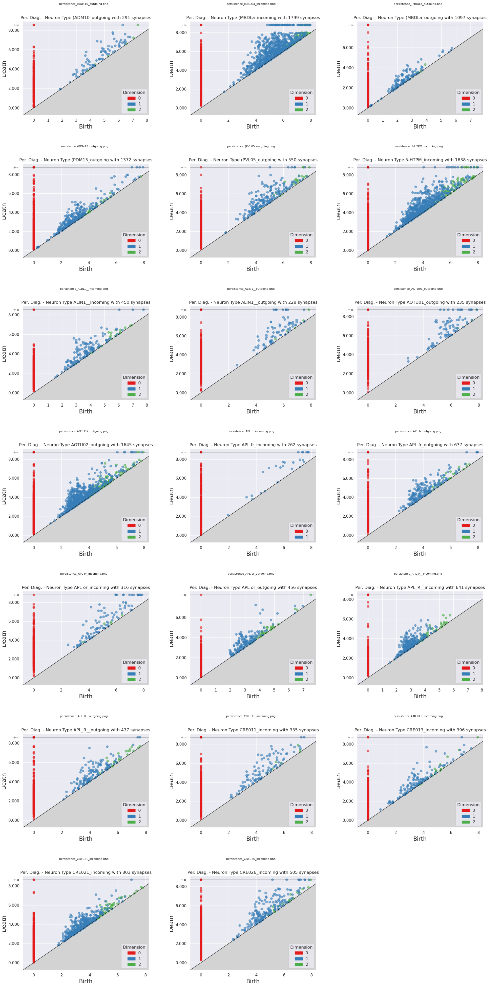

In [115]:
#routine to print out all the saved files
def display_pngs_from_folder(folder_path, cols=4, figsize=(16, 10)):
    files = sorted([f for f in os.listdir(folder_path) if f.endswith('.png')])
    num_files = len(files)
    rows = math.ceil(num_files / cols)

    fig, axs = plt.subplots(rows, cols, figsize=figsize)
    axs = axs.flatten() if num_files > 1 else [axs]

    for ax, fname in zip(axs, files):
        img = mpimg.imread(os.path.join(folder_path, fname))
        ax.imshow(img)
        ax.set_title(fname, fontsize=8)
        ax.axis('off')

    # Hide unused axes
    for ax in axs[num_files:]:
        ax.axis('off')

    plt.subplots_adjust(hspace=0.01)  # reduce to shrink vertical space (try 0.2 or even 0.1)
    plt.tight_layout()
    plt.show()

display_pngs_from_folder(output_dir, cols=3, figsize=(20, 40))

In [ ]:
#################################
#################################
####   Original           #######
#################################
#################################

# Extract the points from the dictionary


# # Open the JSON file for reading
# # with open(local_file_for_subDictLabls, 'r') as f:
# def convert_keys_to_tuples(d):
#     """Convert string representation of tuples back into actual tuple keys."""
#     return {ast.literal_eval(k): v for k, v in d.items()}


# with open(local_file_for_subDict, 'r') as f:
#     json_data = json.load(f)  # Load full JSON

# # Extract only the section that matches subDictTypeKeyName
# filtered_data = json_data.get(subDictTypeKeyName, [])

# #Make a local subdict for use in the Persistence Topology Analysis
# _subDict = [convert_keys_to_tuples(d) for inner_list in filtered_data for d in inner_list]


# print(f'sample of converted data: {converted_data[:2]}')
# # parse the string keys safely and convert them back into tuples using ast.literal_eval, 
# # which correctly interprets tuple-like strings:
# # subDict_converted_data = [convert_keys_to_tuples(d) for d in filtered_data]  # Convert each dictionary in the list


# print(f"\033[32m Combining PSDs: \033[38;2;255;165;0m {update_count} \033[32m new synapses added \033[0m \n")

# start_time = time.time()  # Start timer
# print(f"\033[32m Get pointcloud for {subDictFilter}\033[0m")
# points = np.array(list(subDict.keys()))
# end_time = time.time()  # Stop timer
# print(f"\033[32m Execution time: \033[38;2;255;165;0m  {end_time - start_time:.4f} \033[32m seconds \033[0m\n")


# # Create a Rips complex from the point cloud
# start_time = time.time()  # Start timer
# max_edge_length=8.0
# print(f"\033[32m Generate rips complex with max edge length of  \033[38;2;255;165;0m  {max_edge_length} \033[0m")
# rips_complex = RipsComplex(points=points, max_edge_length=max_edge_length)
# end_time = time.time()  # Stop timer
# print(f"\033[32m Execution time: \033[38;2;255;165;0m  {end_time - start_time:.4f} \033[32m seconds \033[0m\n")

# # Create a simplex tree from the Rips complex
# start_time = time.time()  # Start timer
# max_dimension=3
# print(f"\033[32m Creating a simplex tree from the Rips complex using a max dimension of  \033[38;2;255;165;0m  {max_dimension}\033[0m")
# simplex_tree = rips_complex.create_simplex_tree(max_dimension=max_dimension)
# end_time = time.time()  # Stop timer
# print(f"\033[32m Execution time:  \033[38;2;255;165;0m {end_time - start_time:.4f} \033[32m seconds\033[0m\n")

# # Compute persistence
# print(f"\033[32m Computue persistence for simplex tree \033[0m\n")
# start_time = time.time()  # Start timer
# persistence = simplex_tree.persistence()
# end_time = time.time()  # Stop timer
# print(f"\033[32m Execution time:  \033[38;2;255;165;0m {end_time - start_time:.4f} \033[32m seconds \033[0m\n")

# # Plot using gudhi.plot_persistence_diagram
# print(f"P\033[32m lot using gudhi.plot_persistence_diagram \033[0m")
# start_time = time.time()  # Start timer
# gudhi.plot_persistence_diagram(
#     persistence,
#     alpha=0.6,
#     band=0.0,
#     max_intervals=1000000,
#     inf_delta=0.1,
#     legend=True,
#     fontsize=16,
#     greyblock=True
# )
# end_time = time.time()  # Stop timer
# print(f"\033[32m Execution time:  \033[38;2;255;165;0m  {end_time - start_time:.4f} \033[32m seconds \033[0m\n")

# plt.show()



In [216]:
#Ensure the graph will be output here in the notebool.
matplotlib.use('module://ipykernel.pylab.backend_inline')  # Restores inline plotting in Jupyter

In [29]:

#########################
#########################
###   Old Version  ######
#########################
#########################
# Create a Rips complex and simplex tree

# rips_complex = RipsComplex(points=points, max_edge_length=10.0)
# simplex_tree = rips_complex.create_simplex_tree(max_dimension=3)

# # Set the filtration value to visualize
# filtration_value = 4.1

# # Get simplices up to dimension 2 within the filtration value
# start_time = time.time()  # Start timer
# print(f"\033[32m Get simplices up to dimension 2 within the filtration value \033[38;2;255;165;0m  {filtration_value} \033[0m")
# simplices = [simplex for simplex in simplex_tree.get_skeleton(2) if simplex[1] <= filtration_value]
# end_time = time.time()  # Stop timer
# print(f"\033[32m Execution time: \033[38;2;255;165;0m  {end_time - start_time:.4f} \033[32m seconds \033[0m\n")

# # Plot the 3D point cloud
# fig = plt.figure(figsize=(10, 8))
# ax = fig.add_subplot(111, projection='3d')

# #Set size of points and opacity
# s=20
# alpha=0.6

# start_time = time.time()  # Start timer
# print(f"\033[32m Scatter plot using point size: \033[38;2;255;165;0m {s} \033[32m and opacity: \033[38;2;255;165;0m {alpha}\033[0m")
# ax.scatter(points[:, 0], points[:, 1], points[:, 2], c='blue', s=s, alpha=alpha)
# end_time = time.time()  # Stop timer
# print(f"\033[32m Execution time: \033[38;2;255;165;0m  {end_time - start_time:.4f} \033[32m seconds \033[0m\n")

# ax.set_xlim([np.min(points[:, 0]), np.max(points[:, 0])])
# ax.set_ylim([np.min(points[:, 1]), np.max(points[:, 1])])
# ax.set_zlim([np.min(points[:, 2]), np.max(points[:, 2])])

# # Plot edges and triangles
# start_time = time.time()  # Start timer
# print(f"\033[32m Process edges and triangles \033[0m")

# for simplex, filt in simplices:
#     if len(simplex) == 2:  # Edge
#         ax.plot(*zip(*points[list(simplex)]), color='red', alpha=0.5)
#     elif len(simplex) == 3:  # Triangle
#         tri_pts = points[list(simplex)]
#         tri = Poly3DCollection([tri_pts], color='green', alpha=0.3)
#         ax.add_collection3d(tri)
        
# end_time = time.time()  # Stop timer
# print(f"\033[32m Execution time: \033[38;2;255;165;0m  {end_time - start_time:.4f} \033[32m seconds \033[0m\n")


# ax.set_xlabel('X')
# ax.set_ylabel('Y')
# ax.set_zlabel('Z')
# ax.set_title(f'3D Simplicial Complex at Filtration ≤ {filtration_value}')
# plt.tight_layout()
# plt.show()


 Get simplices up to dimension 2 within the filtration value   3.7 
 Execution time:   0.4566  seconds 

 Process scatter plot using s:  20  and opcacity: 0.6
 Execution time:   0.0023  seconds 

 Process edges using opacity:  0.5
 Execution time:   0.0094  seconds 

 Process triangles using opcacity:   0.3
 Execution time:   0.0068  seconds 



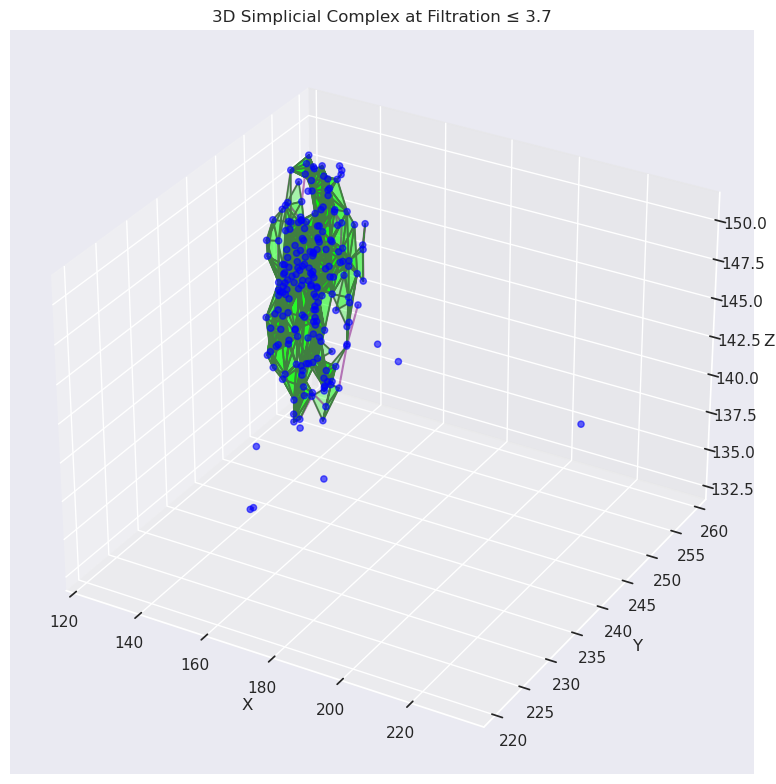

In [222]:
## New Version


# # Optimize Edge Length for Faster Computation
# max_edge_length = 8.0  # Lower value speeds up complex creation
# points = np.array(points)  # Ensure NumPy array for efficiency

# # Create Rips complex and simplex tree
# rips_complex = RipsComplex(points=points, max_edge_length=max_edge_length)
# simplex_tree = rips_complex.create_simplex_tree(max_dimension=3)

# Set filtration value for visualization
filtration_value = 3.7

# Convert simplex tree generator to list & filter directly
start_time = time.time()  # Start timer
print(f"\033[32m Get simplices up to dimension 2 within the filtration value \033[38;2;255;165;0m  {filtration_value} \033[0m")
simplices = list(simplex_tree.get_skeleton(2))
filtered_simplices = [simplex for simplex in simplices if simplex[1] <= filtration_value]
end_time = time.time()  # Stop timer
print(f"\033[32m Execution time: \033[38;2;255;165;0m  {end_time - start_time:.4f} \033[32m seconds \033[0m\n")

# Create 3D figure
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
ax.set_xlim([np.min(points[:, 0]), np.max(points[:, 0])])
ax.set_ylim([np.min(points[:, 1]), np.max(points[:, 1])])
ax.set_zlim([np.min(points[:, 2]), np.max(points[:, 2])])


c='blue'
s=20
alpha=0.6

start_time = time.time()  # Start timer
print(f"\033[32m Process scatter plot using s: \033[38;2;255;165;0m {s} \033[32m and opcacity: \033[38;2;255;165;0m{alpha}\033[0m")
ax.scatter(points[:, 0], points[:, 1], points[:, 2], c=c, s=s, alpha=alpha)
end_time = time.time()  # Stop timer
print(f"\033[32m Execution time: \033[38;2;255;165;0m  {end_time - start_time:.4f} \033[32m seconds \033[0m\n")

# **Batch process edges**
edge_x, edge_y, edge_z = [], [], []
alpha=0.5
color='purple'

start_time = time.time()  # Start timer
print(f"\033[32m Process edges using opacity: \033[38;2;255;165;0m {alpha}\033[0m")
for simplex, filt in filtered_simplices:
    if len(simplex) == 2:
        edge_x.extend(points[list(simplex), 0].tolist() + [np.nan])
        edge_y.extend(points[list(simplex), 1].tolist() + [np.nan])
        edge_z.extend(points[list(simplex), 2].tolist() + [np.nan])

ax.plot(edge_x, edge_y, edge_z, color=color, alpha=alpha)
end_time = time.time()  # Stop timer
print(f"\033[32m Execution time: \033[38;2;255;165;0m  {end_time - start_time:.4f} \033[32m seconds \033[0m\n")


# **Batch process triangles**
triangles = []
color='lime'
alpha=0.3

start_time = time.time()  # Start timer
print(f"\033[32m Process triangles using opcacity:  \033[38;2;255;165;0m {alpha}\033[0m")
for simplex, filt in filtered_simplices:
    if len(simplex) == 3:
        tri_pts = points[list(simplex)]
        triangles.append(tri_pts)
        

if triangles:
    tri_collection = Poly3DCollection(triangles, color=color, alpha=alpha)
    ax.add_collection3d(tri_collection)
    
end_time = time.time()  # Stop timer
print(f"\033[32m Execution time: \033[38;2;255;165;0m  {end_time - start_time:.4f} \033[32m seconds \033[0m\n")

# Labels & Title
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.set_title(f'3D Simplicial Complex at Filtration ≤ {filtration_value}')
plt.tight_layout()

plt.show()  # Backend optimizations should improve rendering speed


In [223]:
simplices = list(simplex_tree.get_skeleton(2))  # Convert to a list
print(type(simplices))  # Should now be a list
print(simplices[:5])    # Show the first 5 entries

<class 'list'>
[([0, 1, 3], 5.842394029847695), ([0, 1, 4], 5.842394029847695), ([0, 1, 11], 5.842394029847695), ([0, 1, 22], 5.870959035796441), ([0, 1, 23], 7.67847068106663)]


In [224]:

# Reduce edge length for efficiency & ensure points are NumPy arrays
max_edge_length = 8.0  # Reduce threshold to speed up complex generation
points = np.array(points)  

# Create Rips complex and simplex tree
rips_complex = RipsComplex(points=points, max_edge_length=max_edge_length)
simplex_tree = rips_complex.create_simplex_tree(max_dimension=3)

# Set filtration value to visualize
filtration_value = 5.0

# Convert skeleton generator to a list
simplices = list(simplex_tree.get_skeleton(2))

# Properly filter by unpacking each tuple correctly
filtered_simplices = [simplex for simplex in simplices if simplex[1] <= filtration_value]


# Create Plotly figure
fig = go.Figure()

# Add points efficiently
fig.add_trace(go.Scatter3d(
    x=points[:, 0], y=points[:, 1], z=points[:, 2],
    mode='markers',
    marker=dict(size=4, color='blue', opacity=0.8),
    name='Points'
))

# **Batch processing for edges**
edge_x, edge_y, edge_z = [], [], []
for simplex, filt in filtered_simplices:
    if len(simplex) == 2:
        edge_x.extend(points[list(simplex), 0].tolist() + [None])  # None separates edges
        edge_y.extend(points[list(simplex), 1].tolist() + [None])
        edge_z.extend(points[list(simplex), 2].tolist() + [None])

fig.add_trace(go.Scatter3d(
    x=edge_x, y=edge_y, z=edge_z,
    mode='lines',
    line=dict(color='red', width=2),
    name='Edges'
))

# **Batch processing for triangles**
tri_x, tri_y, tri_z = [], [], []
for simplex, filt in filtered_simplices:
    if len(simplex) == 3:
        tri_pts = points[list(simplex)]
        tri_x.extend(tri_pts[:, 0].tolist() + [None])  # Using None for proper separation
        tri_y.extend(tri_pts[:, 1].tolist() + [None])
        tri_z.extend(tri_pts[:, 2].tolist() + [None])

fig.add_trace(go.Mesh3d(
    x=tri_x, y=tri_y, z=tri_z,
    color='green', opacity=0.5,
    name='Triangles'
))

# Optimized Layout
fig.update_layout(
    scene=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Z'
    ),
    title=f'3D Simplicial Complex at Filtration ≤ {filtration_value}',
    width=800,
    height=800
)

# Change renderer for better performance
pio.renderers.default = 'iframe'  # Faster than 'notebook' in some cases
fig.show()




In [50]:
html_string = fig.to_html()
js_code = f"window.fbl.loadHTML('{html_string}');"


# Update widgets and widget managers throughout the frontend (included for compatibility)
for i in fbl.widget_manager.widgets:
    if fbl.widget_manager.widgets[i].widget_id not in fbl.client_manager.clients[fbl.widget_manager.widgets[i].client_id]['widgets']:
        fbl.client_manager.clients[fbl.widget_manager.widgets[i].client_id]['widgets'].append(fbl.widget_manager.widgets[i].widget_id)

# Load the diagram
# my_client.tryComms({'widget':'GFX', 
#                     'messageType': 'loadCircuitFromString', 
#                     'data': {'string':data, 'name':'custom'}})

my_client.tryComms({'widget':'GFX', 'messageType': 'eval', 'data': {'data': js_code, 'name':'custom'}})

In [161]:
import numpy as np

# Step 1: Retrieve Neurons Innervating FB Neuropil
neuropil_name = 'FB'
neuropil = flywire.sql_query("""SELECT FROM Neuropil WHERE name = '{}'""".format(neuropil_name))
neurons = neuropil.gen_traversal_in(['ArborizesIn', 'Neuron'], min_depth=1)

# Step 2: Count Synapses within FB Neuropil
synapse_counts = {}

# Assuming 'neuron' is your neuron object
synapse_classes = ['Synapse', 'InferredSynapse']

for neuron in neurons.node_objs:
    neuron_name = neuron._props['name']

    # Perform the traversal using the 'SendsTo' relationship
    outgoing_synapses = neuron.out('SendsTo')

    # Inspect the properties of the outgoing synapses
    for synapse in outgoing_synapses:
        pass

in_neuropils = synapse.out('LocatedIn') # Adjust based on your exact relationship for neuropil in in_neuropils: if neuropil._props['name'] ==



In [236]:

## In this step we gather all the Neurotransmitter data from flywire
#This can be only done for each type 
# Initialize a counter for the number of batches processed
neuron_count = 0
neuroTransmitterDict = {} #we store unique list of neur type and neurotrans

#Store Tau values related to their neurotransmitter
#Needs to be updated with further research
tauDict = {"acetylcholine" : 2.0,
           "glutamate"     : 10,
           "GABA"          : 5,
           "dopamine"      : 2,
           "octopamine"    : 5,
           "serotonin"     : 5
          }


# Function to clean neuron names 
def clean_name(name): 
    # Remove non-printable characters and strip leading/trailing whitespace 
    return re.sub(r'[^\x20-\x7E]', '', name).strip()

def process_batch(neuron_names):
    
    global neuron_count # Declare neuron_count as global to modify it inside this function

    # Clean and ensure the SQL query is properly formatted and remove any duplicates
    unique_names = list(set(clean_name(name) for name in neuron_names))  # Remove duplicate names and clean them
    query_conditions = " OR ".join(f"name = '{name}'" for name in unique_names)  # Format the conditions correctly
    query = f"SELECT FROM Neuron WHERE {query_conditions}"  # Construct the query
    
    # Debug: Print the query to inspect it
    #print(f"Executing query: {query}")
    
    try:
        query_result = flywire.sql_query(query)         
        nt_query_result = query_result.gen_traversal_out(['HasData', 'NeurotransmitterData'], min_depth = 1)
        number_nodes = len(nt_query_result.node_objs)
        
        if len(nt_query_result.node_objs) > 0:
            neuron_count += number_nodes
            
            for neuron in nt_query_result.node_objs:
                neuron_name = neuron._props['name']
                nt = neuron._props['Transmitters']
                neuroTransmitterDict[neuron_name] = nt
               
                
    except Exception as e:
        print(f"Error retrieving or neurotransmitter data: {e}")


# Define the batch size and limit on the number of batches
batch_size = 20  # Adjust this value based on your system's capabilities
batch_limit = 100  # Adjust this value to experiment with a variable number of batches

# Collect neuron names and clean them
neuron_names = [clean_name(neuron._props['name']) for neuron in itertools.islice(neurons.node_objs, maxLoop) if neuron._props['name'] != 'unknown']

batch_count = 0

# Process neuron names in batches with a limit on the number of batches
for i in range(0, len(neuron_names), batch_size):
    if batch_count >= batch_limit:
        break
    batch = neuron_names[i:i+batch_size]
    process_batch(batch)
    batch_count += 1
    print(f"Processed batch {batch_count}/{batch_limit}")

print(f"Neuron Total Processed: {neuron_count}")
print(f"Total neurons expected: {len(neuron_names)}")

# Sort the neuroTransmitterDict by keys in alphabetical order 
sorted_neuroTransmitterDict = dict(sorted(neuroTransmitterDict.items()))

# Save the sorted dictionary to a JSON file 
output_file = "neuro_transmitter_data.json" 
with open(output_file, 'w') as file: 
    json.dump(sorted_neuroTransmitterDict, file, indent=4)



Processed batch 1/100
Processed batch 2/100
Processed batch 3/100
Processed batch 4/100
Processed batch 5/100
Processed batch 6/100
Processed batch 7/100
Processed batch 8/100
Processed batch 9/100
Processed batch 10/100
Processed batch 11/100
Processed batch 12/100
Processed batch 13/100
Processed batch 14/100
Processed batch 15/100
Processed batch 16/100
Processed batch 17/100
Processed batch 18/100
Processed batch 19/100
Processed batch 20/100
Processed batch 21/100
Processed batch 22/100
Processed batch 23/100
Processed batch 24/100
Processed batch 25/100
Processed batch 26/100
Processed batch 27/100
Processed batch 28/100
Processed batch 29/100
Processed batch 30/100
Processed batch 31/100
Processed batch 32/100
Processed batch 33/100
Processed batch 34/100
Processed batch 35/100
Processed batch 36/100
Processed batch 37/100
Processed batch 38/100
Processed batch 39/100
Processed batch 40/100
Processed batch 41/100
Processed batch 42/100
Processed batch 43/100
Processed batch 44/1

In [ ]:
# Sort the dictionary by keys 
sorted_neuroTransmitterDict = dict(sorted(neuroTransmitterDict.items()))
print(sorted_neuroTransmitterDict)



In [ ]:
#chatGPT original
    
data = neuroTransmitterDict

# Step 1: Count neurotransmitters and total synapses using each neurotransmitter
neurotransmitter_counts = Counter()
for neuron_data in data.values():
    for neurotransmitter in neuron_data:
        neurotransmitter_counts[neurotransmitter] += 1

# Step 2: Calculate total synapses and neurotransmitter percentages
total_synapses = sum(neurotransmitter_counts.values())
neurotransmitter_percentages = {nt: (count / total_synapses) * 100 for nt, count in neurotransmitter_counts.items()}

# Step 3: Calculate neurotransmitter usage by neuron type (prefix of neuron name)
neuron_type_counts = defaultdict(Counter)
for neuron_name, neuron_data in data.items():
    neuron_type = neuron_name.split('_')[0]  # extract prefix before '_'
    for neurotransmitter in neuron_data:
        neuron_type_counts[neuron_type][neurotransmitter] += 1

# Step 4: Visualizations
# 4.1 Pie chart for neurotransmitter distribution
plt.figure(figsize=(8, 8))
plt.pie(neurotransmitter_counts.values(), labels=neurotransmitter_counts.keys(), autopct='%1.1f%%', startangle=140)
plt.title("Neurotransmitter Distribution")
plt.show()

# 4.2 Bar chart for neurotransmitter usage by neuron type
fig, ax = plt.subplots(figsize=(10, 6))
for neurotransmitter, color in zip(neurotransmitter_counts.keys(), ['#ff9999','#66b3ff','#99ff99','#ffcc99']):
    neuron_types = list(neuron_type_counts.keys())
    counts = [neuron_type_counts[nt][neurotransmitter] for nt in neuron_types]
    ax.bar(neuron_types, counts, label=neurotransmitter, color=color)

ax.set_xlabel("Neuron Type")
ax.set_ylabel("Number of Synapses")
ax.set_title("Neurotransmitter Usage by Neuron Type")
ax.legend(title="Neurotransmitter")
plt.xticks(rotation=45)
plt.show()

# Display results for neurotransmitter percentages and neuron type data
neurotransmitter_percentages, neuron_type_counts


# Filter data to include only neuron types that start with 'FB' or 'FC'
selected_prefixes = ['FB', 'FC']

filtered_neuron_type_counts = {nt: counts for nt, counts in neuron_type_counts.items() if any(nt.startswith(prefix) for prefix in selected_prefixes)}

# Re-calculate neurotransmitter totals specifically for 'FB' and 'FC' neuron types
filtered_neurotransmitter_counts = Counter()
for counts in filtered_neuron_type_counts.values():
    for neurotransmitter, count in counts.items():
        filtered_neurotransmitter_counts[neurotransmitter] += count

# Total synapses in selected neuron types
filtered_total_synapses = sum(filtered_neurotransmitter_counts.values())
filtered_neurotransmitter_percentages = {nt: (count / filtered_total_synapses) * 100 for nt, count in filtered_neurotransmitter_counts.items()}

# Step 4.1: Re-generate pie chart for neurotransmitter distribution (filtered to 'FB' and 'FC')
plt.figure(figsize=(8, 8))
plt.pie(filtered_neurotransmitter_counts.values(), labels=filtered_neurotransmitter_counts.keys(),
        autopct='%1.1f%%', startangle=140)
plt.title("Neurotransmitter Distribution in 'FB' and 'FC' Neuron Types")
plt.show()

# Step 4.2: Re-generate bar chart for neurotransmitter usage by neuron type (filtered to 'FB' and 'FC')
fig, ax = plt.subplots(figsize=(10, 6))
for neurotransmitter, color in zip(filtered_neurotransmitter_counts.keys(), ['#ff9999','#66b3ff','#99ff99','#ffcc99']):
    neuron_types = list(filtered_neuron_type_counts.keys())
    counts = [filtered_neuron_type_counts[nt][neurotransmitter] for nt in neuron_types]
    ax.bar(neuron_types, counts, label=neurotransmitter, color=color)

ax.set_xlabel("Neuron Type")
ax.set_ylabel("Number of Synapses")
ax.set_title("Neurotransmitter Usage by 'FB' and 'FC' Neuron Types")
ax.legend(title="Neurotransmitter")
plt.xticks(rotation=45)
plt.show()

# Display the neurotransmitter percentages for the filtered neuron types
filtered_neurotransmitter_percentages


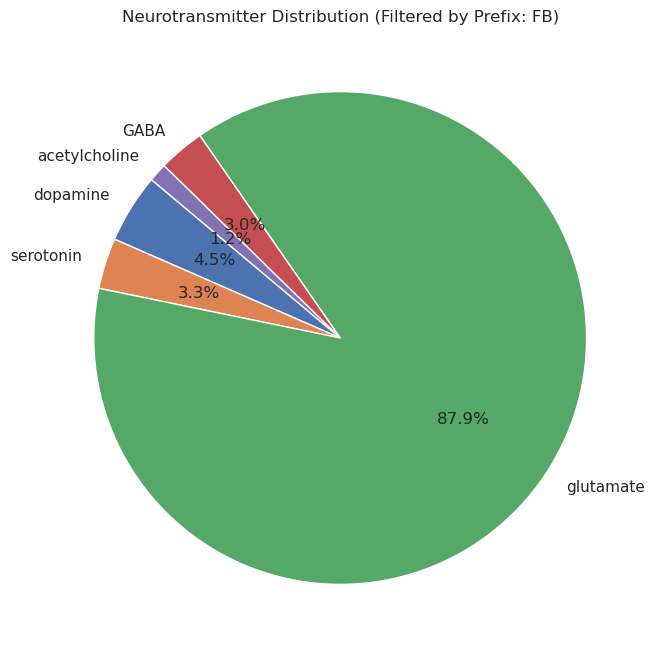

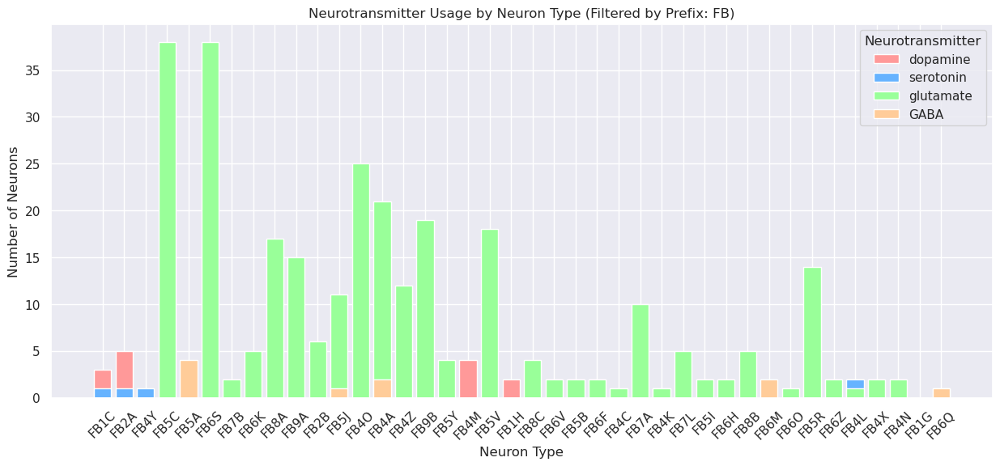

{'dopamine': 4.545454545454546,
 'serotonin': 3.3333333333333335,
 'glutamate': 87.87878787878788,
 'GABA': 3.0303030303030303,
 'acetylcholine': 1.2121212121212122}

In [238]:
#copilot

data = neuroTransmitterDict

# Define a threshold for the maximum number of synapses a neuron or neuron type should have
synapse_threshold = 100  # Adjust this threshold as needed
prefix_length = 4  # Set the desired prefix length (e.g., 3 or 4)
width_factor = 1.5  # Adjust this factor to increase/decrease the width of the graph
prefix_filter = 'FB'  # Set the prefix to filter neuron types

# Step 1: Count neurotransmitters and total synapses using each neurotransmitter
neurotransmitter_counts = Counter()
for neuron_data in data.values():
    for neurotransmitter in neuron_data:
        neurotransmitter_counts[neurotransmitter] += 1

# Step 2: Calculate total synapses and neurotransmitter percentages
total_neuron_types = sum(neurotransmitter_counts.values())
neurotransmitter_percentages = {nt: (count / total_neuron_types) * 100 for nt, count in neurotransmitter_counts.items()}

# Step 3: Calculate neurotransmitter usage by neuron type (variable prefix length)
neuron_type_counts = defaultdict(Counter)
for neuron_name, neuron_data in data.items():
    neuron_type = neuron_name[:prefix_length]  # Extract prefix of specified length
    if neuron_name.startswith(prefix_filter):  # Apply prefix filter
        for neurotransmitter in neuron_data:
            neuron_type_counts[neuron_type][neurotransmitter] += 1

# Step 4: Filter out neuron types that exceed the synapse threshold
filtered_neuron_type_counts = {nt: counts for nt, counts in neuron_type_counts.items()
                               if sum(counts.values()) <= synapse_threshold}

# Re-calculate neurotransmitter totals after filtering
filtered_neurotransmitter_counts = Counter()
for counts in filtered_neuron_type_counts.values():
    for neurotransmitter, count in counts.items():
        filtered_neurotransmitter_counts[neurotransmitter] += count

# Total synapses in filtered neuron types
filtered_total_synapses = sum(filtered_neurotransmitter_counts.values())
filtered_neurotransmitter_percentages = {nt: (count / filtered_total_synapses) * 100 for nt, count in filtered_neurotransmitter_counts.items()}

# Step 5: Visualizations

# 5.1 Pie chart for neurotransmitter distribution (filtered)
plt.figure(figsize=(8, 8))
plt.pie(filtered_neurotransmitter_counts.values(), labels=filtered_neurotransmitter_counts.keys(),
        autopct='%1.1f%%', startangle=140)
plt.title(f"Neurotransmitter Distribution (Filtered by Prefix: {prefix_filter})")
plt.show()

# 5.2 Bar chart for neurotransmitter usage by neuron type (filtered)
fig, ax = plt.subplots(figsize=(10 * width_factor, 6))  # Adjust width using width_factor
for neurotransmitter, color in zip(filtered_neurotransmitter_counts.keys(), ['#ff9999','#66b3ff','#99ff99','#ffcc99']):
    neuron_types = list(filtered_neuron_type_counts.keys())
    counts = [filtered_neuron_type_counts[nt][neurotransmitter] for nt in neuron_types]
    ax.bar(neuron_types, counts, label=neurotransmitter, color=color)

ax.set_xlabel("Neuron Type")
ax.set_ylabel("Number of Neurons")
ax.set_title(f"Neurotransmitter Usage by Neuron Type (Filtered by Prefix: {prefix_filter})")
ax.legend(title="Neurotransmitter")
plt.xticks(rotation=45)
plt.show()

# Display the filtered neurotransmitter percentages
filtered_neurotransmitter_percentages


In [134]:
outDict = {}
inDict = {}
query = f"SELECT FROM Neuron WHERE name = 'FB1G'"  # Construct the query
query_result = flywire.sql_query(query) 
#query_result = query_result.gen_traversal_out(['HasData', 'NeurotransmitterData'], min_depth = 1)
out_query_result = query_result.gen_traversal_out(['HasData','ArborizationData'], min_depth = 1)

print("outDict")
for neuron in out_query_result.node_objs:
    neuron_name = neuron._props['uname']
    outProps = neuron._props
    outDict[neuron_name] = outProps

display(JSON(outDict))   
print('-----------')

query = f"SELECT FROM Neuron WHERE name = 'FB1G'"  # Construct the query
query_result = flywire.sql_query(query) 
#query_result = query_result.gen_traversal_out(['HasData', 'NeurotransmitterData'], min_depth = 1)
in_query_result = query_result.gen_traversal_in(['HasData','ArborizationData'], min_depth = 1)

for neuron in in_query_result.node_objs:
    neuron_name = neuron._props['uname']
    inProps = neuron._props
    inDict[neuron_name] = inProps

display(JSON(inDict))
    

outDict


<IPython.core.display.JSON object>

-----------


<IPython.core.display.JSON object>

In [232]:
# timer
start_time = time.time()

numberofSynapses = 0
numberOfNeurons = 0



synapse_counts = {}

# Regex pattern to match synapses starting with '--FB'
pattern = re.compile(r'--FB(.+)$')

maxLoop = 8000  # Change this to desired number of lines
# Iterate through each neuron and its outgoing synapses
for neuron in itertools.islice(neurons.node_objs, maxLoop):
    neuron_name = neuron._props['name']
    synapse_counts[neuron_name] = {}
    
    # Get outgoing synapses using the 'SendsTo' relationship
    outgoing_synapses = neuron.out('SendsTo')
    # Keep a running total of all synapses
    numberofSynapses += len(outgoing_synapses)
    
    
    for synapse in outgoing_synapses:
        synapse_name = synapse.get_props()['name']
        
        # Use regex to check if the synapse name starts with '--FB'
        match = pattern.search(synapse_name)
        if match:
            # Ensure the synapse name is in the dictionary for the current neuron before incrementing
            if synapse_name not in synapse_counts[neuron_name]:
                synapse_counts[neuron_name][synapse_name] = 0
            synapse_counts[neuron_name][synapse_name] += synapse.get_props()['N']


numberOfNeurons = len(neurons)

# End the timer
end_time = time.time()

# Calculate the elapsed time
elapsed_time = end_time - start_time

print(f"Elapsed time: {elapsed_time:.2f} seconds")
print('--------------------')
print(f"{numberOfNeurons} neurons processed")
print(f"{numberofSynapses} Synapses processed")
                
# Print the synapse counts for each neuron type
for neuron_type, synapses in synapse_counts.items():
    print(f"Neuron Type: {neuron_type}")
    for synapse_name, count in synapses.items():
        print(f"  Synapse: {synapse_name}, Count: {count}")




Elapsed time: 290.90 seconds
--------------------
3131 neurons processed
104517 Synapses processed
Neuron Type: LALv1
  Synapse: LALv1--FB1G, Count: 17
Neuron Type: FB2A
  Synapse: FB2A--FB2A, Count: 33
  Synapse: FB2A--FB2B, Count: 16
Neuron Type: FC2B
  Synapse: FC2B--FB5A, Count: 58
  Synapse: FC2B--FB5C, Count: 5
Neuron Type: FB5H
  Synapse: FB5H--FB5R, Count: 22
  Synapse: FB5H--FB4Y, Count: 29
  Synapse: FB5H--FB5C, Count: 10
  Synapse: FB5H--FB5J, Count: 49
  Synapse: FB5H--FB5A, Count: 41
  Synapse: FB5H--FB5H, Count: 13
Neuron Type: Tubu02
Neuron Type: pC1d_TopOutputs  | AVLP_pr36
Neuron Type: vDeltaA
  Synapse: vDeltaA--FB4A, Count: 12
Neuron Type: FS2
  Synapse: FS2--FB6H, Count: 5
Neuron Type: SA1
Neuron Type: FB4Y
  Synapse: FB4Y--FB5J, Count: 5
Neuron Type: ER2
Neuron Type: PFNm
  Synapse: PFNm--FB1C, Count: 5
Neuron Type: FB5C
  Synapse: FB5C--FB5R, Count: 5
  Synapse: FB5C--FB5C, Count: 7
Neuron Type: SMP529
Neuron Type: DM6_medial
  Synapse: DM6_medial--FB6H, Count: 6


In [ ]:
print(synapse_counts)

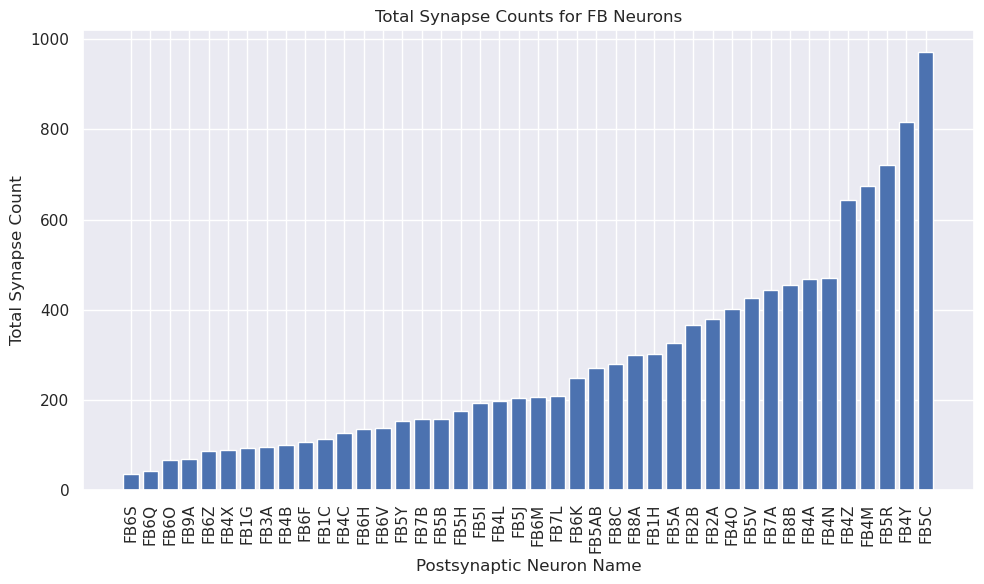

In [16]:
import matplotlib.pyplot as plt
from collections import defaultdict

# Aggregate the total synapse counts for each postsynaptic neuron that starts with 'FB'
fb_synapse_counts = defaultdict(int)

for neuron_name, synapses in synapse_counts.items():
    for synapse_name, count in synapses.items():
        # Extract the postsynaptic neuron name after '--'
        match = re.search(r'--FB(.+)$', synapse_name)
        if match:
            postsynaptic_name = 'FB' + match.group(1)
            fb_synapse_counts[postsynaptic_name] += count

# Sort the dictionary by synapse counts
sorted_synapse_counts = dict(sorted(fb_synapse_counts.items(), key=lambda item: item[1]))

# Create the histogram
plt.figure(figsize=(10, 6))
plt.bar(sorted_synapse_counts.keys(), sorted_synapse_counts.values())

plt.xlabel('Postsynaptic Neuron Name')
plt.ylabel('Total Synapse Count')
plt.title('Total Synapse Counts for FB Neurons')
plt.xticks(rotation=90)
plt.tight_layout()

# Display the histogram
plt.show()


Significant neuron pairs with p-values < 0.05:
FB4Z -> hDeltaA with p-value 2.8364523752115437e-60
FB5R -> hDeltaH with p-value 6.135050603972756e-60
FB8B -> hDeltaD with p-value 7.86249188697021e-13
FB4A -> hDeltaB with p-value 5.658250852782267e-11
FB5R -> hDeltaG with p-value 4.4639622043262294e-08
FB4N -> FB1G with p-value 9.105941166487129e-06
FB8B -> hDeltaE with p-value 2.143704626061617e-05
FB8C -> hDeltaD with p-value 2.143704626061617e-05
FB4N -> hDeltaB with p-value 0.00022839625489965354
FB5C -> FB5AB with p-value 0.0003289868018005364
FB5Y -> FB5AB with p-value 0.0005599045911972455
FB8B -> DNpe053 with p-value 0.0007898612897149187
FB9A -> hDeltaD with p-value 0.001800480009034045
FB7B -> hDeltaE with p-value 0.0021099143148521683
FB4O -> hDeltaI with p-value 0.008018615109024756
FB5I -> hDeltaC with p-value 0.009206685783609508
FB5C -> hDeltaM with p-value 0.013767438265455255
FB5C -> hDeltaI with p-value 0.015680336335970716
FB4A -> hDeltaI with p-value 0.02021856198899

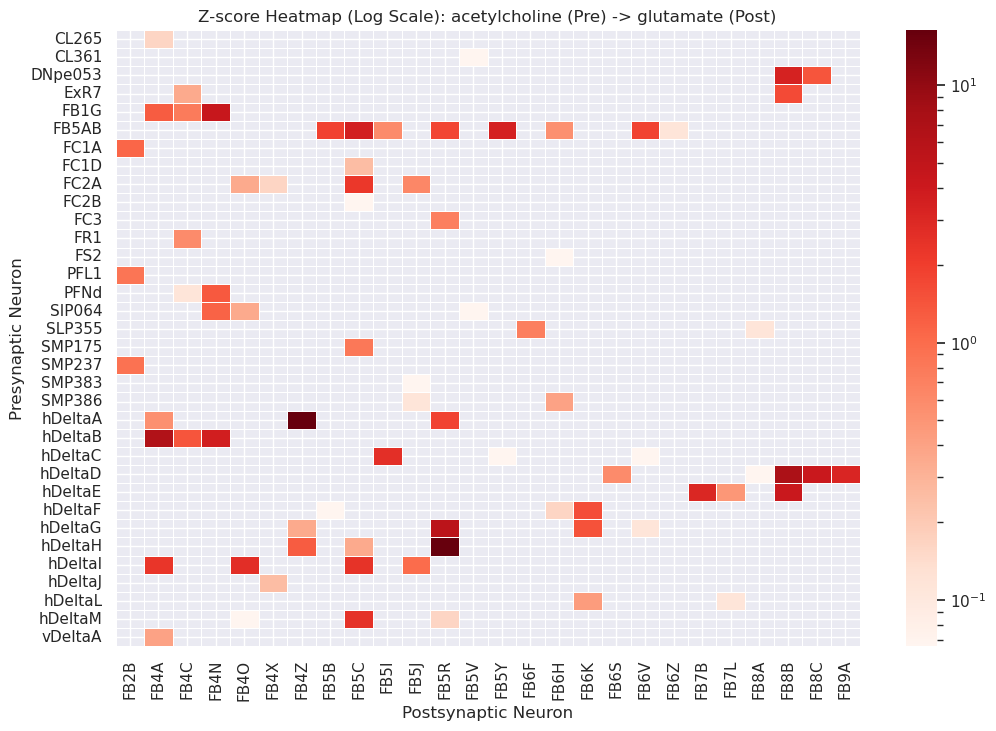

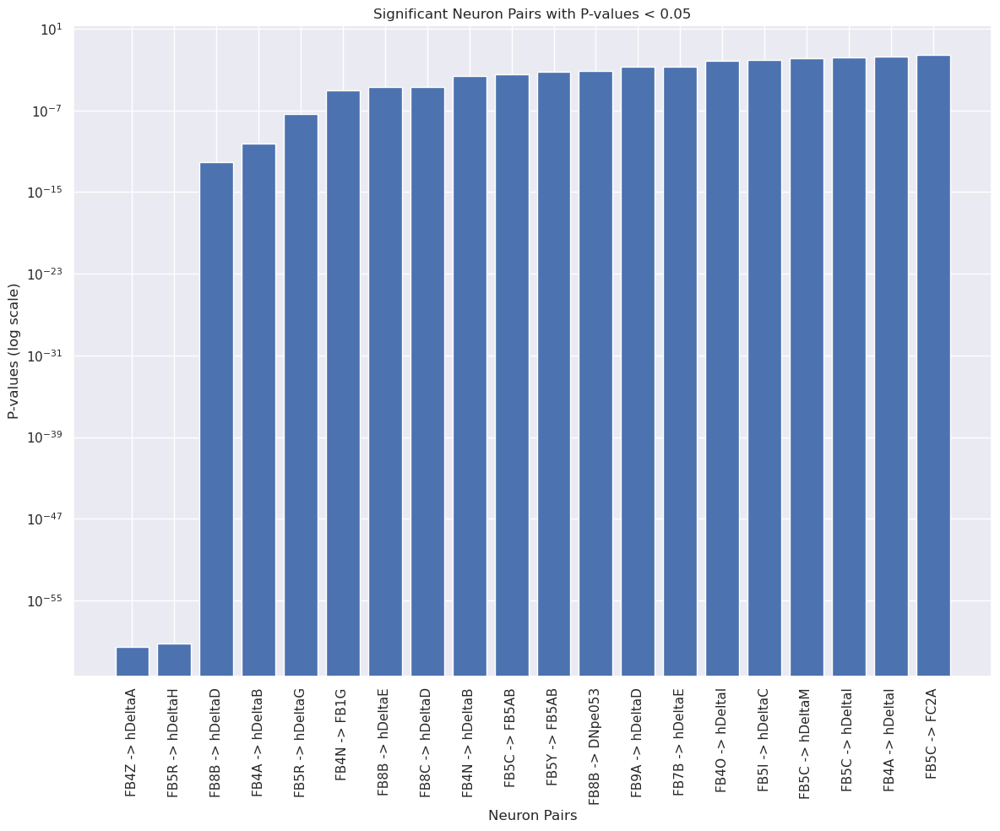

Significant neuron pairs with p-values < 0.05:
FB5C -> ExR5 with p-value 1.757114845679901e-38
FB4Z -> FB5V with p-value 1.468531397426441e-31
FB7A -> FB7B with p-value 1.603621458838004e-21
FB7A -> FB6S with p-value 3.4182705403753215e-12
FB4O -> FB4O with p-value 1.1671204039779588e-11
FB8C -> FB8A with p-value 3.8789466953076863e-10
FB7A -> FB6H with p-value 8.145459811256446e-10
FB2B -> ExR5 with p-value 1.6878485571996986e-09
FB5B -> FB5I with p-value 3.7998633752268854e-08
FB5C -> FB5B with p-value 8.82717641800588e-07
FB5C -> FB5R with p-value 6.5600724380617075e-06
FB8B -> FB7B with p-value 0.00017784479129838082
FB5V -> FB4Z with p-value 0.00028143441019035846
FB6K -> FB5Y with p-value 0.0005468706084859632
FB4O -> ExR5 with p-value 0.0008380080278863098
FB7L -> FB7B with p-value 0.0008380080278863098
FB8A -> FB7B with p-value 0.001267803597583103
FB5V -> ExR5 with p-value 0.008305526251304473
FB8A -> FB8C with p-value 0.009851101243049854
FB4Z -> FB4Z with p-value 0.013729776

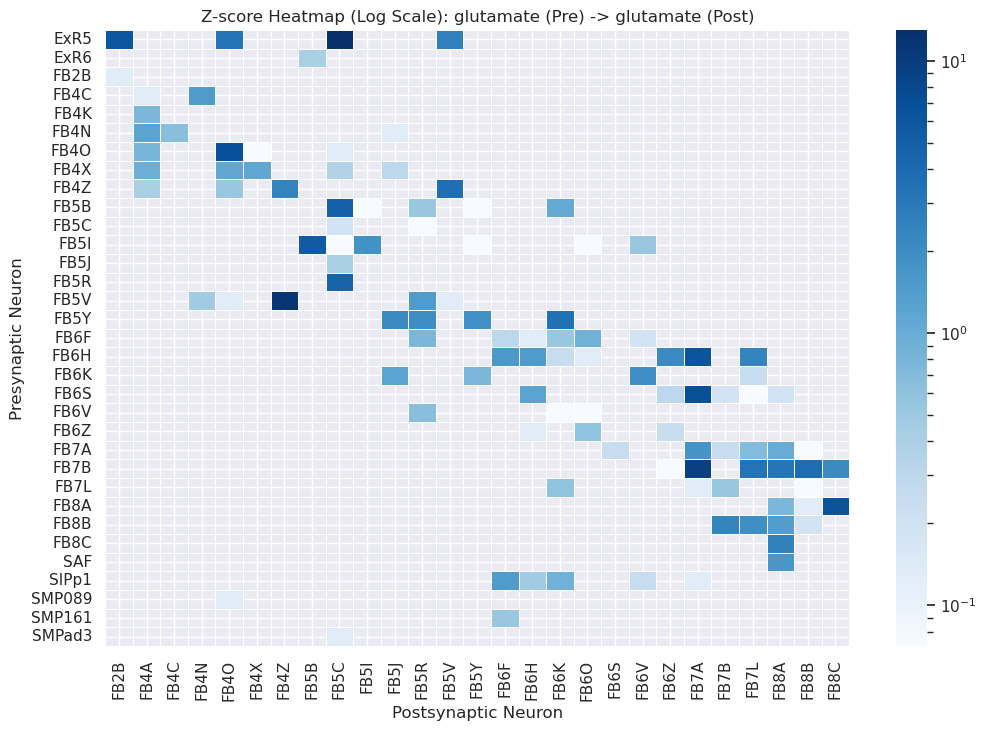

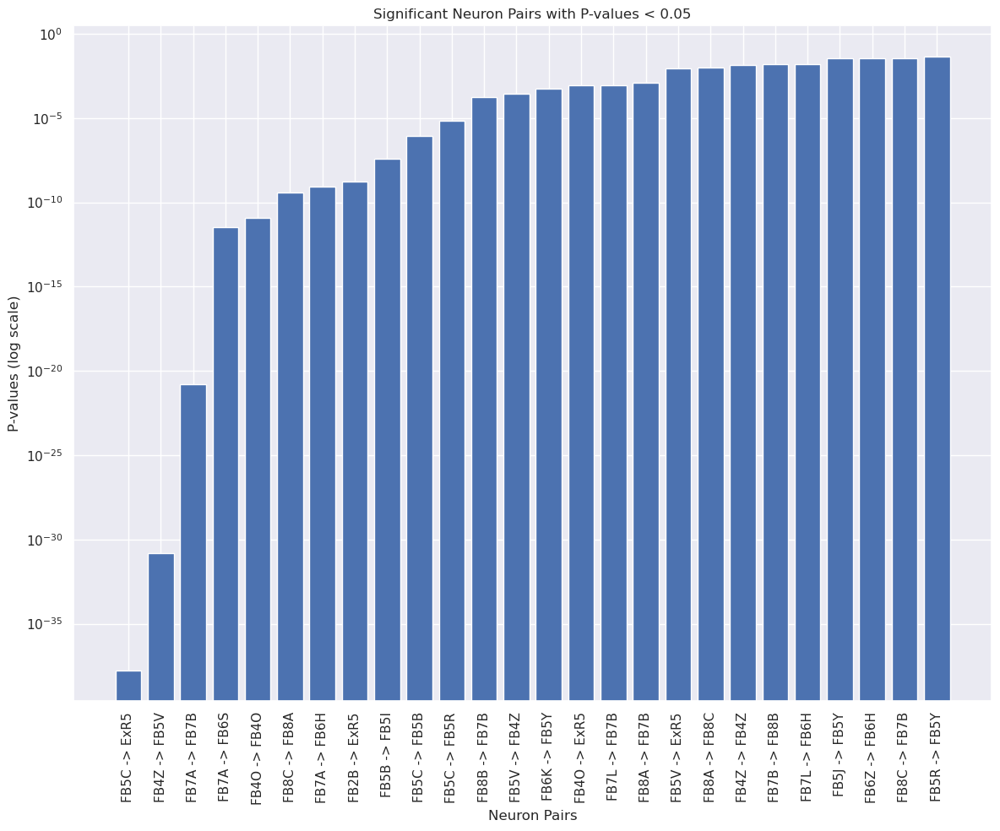

Significant neuron pairs with p-values < 0.05:
No data available for serotonin (Pre) -> serotonin (Post)
[twisted 2024-11-18 03:08:36,489] /tmp/ipykernel_613/1660492094.py:76: builtins.RuntimeWarning: Mean of empty slice.
[twisted 2024-11-18 03:08:36,492] /home/ffbo/miniconda/envs/ffbo/lib/python3.9/site-packages/numpy/core/_methods.py:129: builtins.RuntimeWarning: invalid value encountered in scalar divide
[twisted 2024-11-18 03:08:36,493] /home/ffbo/miniconda/envs/ffbo/lib/python3.9/site-packages/numpy/core/_methods.py:206: builtins.RuntimeWarning: Degrees of freedom <= 0 for slice
[twisted 2024-11-18 03:08:36,494] /home/ffbo/miniconda/envs/ffbo/lib/python3.9/site-packages/numpy/core/_methods.py:163: builtins.RuntimeWarning: invalid value encountered in divide
[twisted 2024-11-18 03:08:36,495] /home/ffbo/miniconda/envs/ffbo/lib/python3.9/site-packages/numpy/core/_methods.py:198: builtins.RuntimeWarning: invalid value encountered in scalar divide


In [316]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
from collections import Counter, defaultdict
from matplotlib.colors import LogNorm
from scipy.stats import norm

# Function to extract the neuron type prefix from neuron names
def get_neuron_type(neuron_name):
    return neuron_name.split('_')[0]

# Function to determine the most common neurotransmitter for each cell type
def get_most_common_neurotransmitter(neuroTransmitterDict):
    neuron_type_to_transmitters = defaultdict(list)
    
    for neuron, transmitters in neuroTransmitterDict.items():
        neuron_type = get_neuron_type(neuron)
        neuron_type_to_transmitters[neuron_type].extend(transmitters)
    
    neuron_type_to_common_transmitter = {}
    for neuron_type, transmitters in neuron_type_to_transmitters.items():
        most_common_transmitter = Counter(transmitters).most_common(1)[0][0]
        neuron_type_to_common_transmitter[neuron_type] = most_common_transmitter
    
    return neuron_type_to_common_transmitter

# Ensure your neuroTransmitterDict is defined before calling this
neuron_type_to_common_transmitter = get_most_common_neurotransmitter(neuroTransmitterDict)

debug_mode = False  # Set to False to disable debugging prints

# Function to create the heatmap for specific neurotransmitter pairs and calculate p-values
def create_heatmap_with_pvalues(presynaptic_neurotransmitter, postsynaptic_neurotransmitter, heatmap_color, show_all_data, p_value_threshold=0.05):
    # Create a dictionary to store counts for heatmap
    heatmap_data = defaultdict(lambda: defaultdict(int))
    
    # Populate the dictionary with counts from synapse_counts
    for presynaptic_neuron, synapses in synapse_counts.items():
        pre_neurotransmitter = neuron_type_to_common_transmitter.get(presynaptic_neuron, None)
        if debug_mode: print(f"Presynaptic Neuron: {presynaptic_neuron}, Neurotransmitter: {pre_neurotransmitter}")
        for synapse, count in synapses.items():
            postsynaptic_neuron = synapse.split('--')[1]
            post_neurotransmitter = neuron_type_to_common_transmitter.get(postsynaptic_neuron, None)
            if debug_mode: print(f"  Synapse: {synapse}, Postsynaptic Neuron: {postsynaptic_neuron}, Neurotransmitter: {post_neurotransmitter}, Count: {count}")
            if pre_neurotransmitter == presynaptic_neurotransmitter and post_neurotransmitter == postsynaptic_neurotransmitter:
                heatmap_data[presynaptic_neuron][postsynaptic_neuron] = count
                if debug_mode: print(f"    Added to heatmap: {presynaptic_neuron} -> {postsynaptic_neuron} with count {count}")

    if debug_mode:
        print("Final heatmap_data:")
        print(dict(heatmap_data))  # Convert defaultdict to dict for clearer printing

    if show_all_data:
        # Ensure all neurons from the synapse_counts are included even if they don't have matching neurotransmitters
        all_presynaptic_neurons = set(synapse_counts.keys())
        all_postsynaptic_neurons = set()
        for synapses in synapse_counts.values():
            for synapse in synapses:
                all_postsynaptic_neurons.add(synapse.split('--')[1])

        for presynaptic_neuron in all_presynaptic_neurons:
            if presynaptic_neuron not in heatmap_data:
                heatmap_data[presynaptic_neuron] = defaultdict(int)
            for postsynaptic_neuron in all_postsynaptic_neurons:
                if postsynaptic_neuron not in heatmap_data[presynaptic_neuron]:
                    heatmap_data[presynaptic_neuron][postsynaptic_neuron] = 0

    # Convert dictionary to a DataFrame for use with seaborn
    heatmap_df = pd.DataFrame(heatmap_data).fillna(0)
    if debug_mode:
        print("Heatmap DataFrame (before sorting):")
        print(heatmap_df)

    # Calculate z-scores
    mean_val = heatmap_df.values.mean()
    std_dev = heatmap_df.values.std()
    z_scores = (heatmap_df - mean_val) / std_dev

    if debug_mode:
        print("Z-score Heatmap DataFrame (before sorting):")
        print(z_scores)

    # Reconfirm sorting
    presynaptic_sorted = sorted(z_scores.index)
    postsynaptic_sorted = sorted(z_scores.columns)

    if debug_mode:
        print("Presynaptic neurons sorted: ", presynaptic_sorted)
        print("Postsynaptic neurons sorted: ", postsynaptic_sorted)

    # Re-index and re-order DataFrame
    z_scores = z_scores.reindex(index=presynaptic_sorted, columns=postsynaptic_sorted)

    if debug_mode:
        print("Sorted Z-score Heatmap DataFrame (after sorting):")
        print(z_scores)
    
    # Calculate p-values
    p_values = norm.sf(abs(z_scores)) * 2  # Two-tailed p-value

    if debug_mode:
        print("P-values Heatmap DataFrame:")
        print(p_values)

    # Filter significant pairs based on p-value threshold
    significant_pairs = p_values < p_value_threshold
    significant_coords = np.where(significant_pairs)
    significant_list = [(z_scores.index[x], z_scores.columns[y], p_values[x, y]) for x, y in zip(significant_coords[0], significant_coords[1])]

    # Sort significant pairs by p-value
    significant_list.sort(key=lambda x: x[2])

    print(f"Significant neuron pairs with p-values < {p_value_threshold}:")
    for pair in significant_list:
        print(f"{pair[0]} -> {pair[1]} with p-value {pair[2]}")

    if not z_scores.empty:
        # Plot the heatmap with a logarithmic color scale
        plt.figure(figsize=(12, 8))
        sns.heatmap(z_scores.T, annot=show_annotations, cmap=heatmap_color, linewidths=.5, norm=LogNorm())
        plt.title(f'Z-score Heatmap (Log Scale): {presynaptic_neurotransmitter} (Pre) -> {postsynaptic_neurotransmitter} (Post)')
        plt.xlabel('Postsynaptic Neuron')
        plt.ylabel('Presynaptic Neuron')
        plt.show()
    else:
        print(f"No data available for {presynaptic_neurotransmitter} (Pre) -> {postsynaptic_neurotransmitter} (Post)")

    # Plot significant pairs
    if significant_list:
        plot_significant_pairs(significant_list)

# Define a function to plot significant pairs
def plot_significant_pairs(significant_pairs):
    presynaptic_neurons = [f"{pair[0]} -> {pair[1]}" for pair in significant_pairs]
    p_values = [pair[2] for pair in significant_pairs]

    # Adjust the figure size
    fig_width = 12
    fig_height = min(10, len(presynaptic_neurons) * 0.5)

    # Create the plot
    plt.figure(figsize=(fig_width, fig_height))
    bars = plt.bar(presynaptic_neurons, p_values, log=True)

    plt.xlabel('Neuron Pairs')
    plt.ylabel('P-values (log scale)')
    plt.title('Significant Neuron Pairs with P-values < 0.05')
    plt.xticks(rotation=90, ha='center', va='top')
    plt.tight_layout()
    plt.show()

# Example usage
show_annotations = False  # Variable to control whether to show annotations
show_all_data = False  # Variable to control whether to show all data or only matching data
create_heatmap_with_pvalues('acetylcholine', 'glutamate', 'Reds', show_all_data, p_value_threshold=0.05)
create_heatmap_with_pvalues('glutamate', 'glutamate', 'Blues', show_all_data, p_value_threshold=0.05)


In [ ]:


neuropil = database.sql_query(""" select from Neuropil where name = "{}" """.format(neuropil_name)) 
neurons = neuropil.gen_traversal_in(['ArborizesIn', 'Neuron'], min_depth = 1) 
celltype_names = list(np.unique([neuron.name for neuron in neurons.node_objs]))

neuropil = database.sql_query(""" select from Neuropil where name = "{}" """\ .format(neuropil_name)) 
neurons = neuropil.gen_traversal_in(['ArborizesIn', 'Neuron'], min_depth = 1) 
neuron_names = [neuron.uname for neuron in neurons.node_objs]

query_result = database.sql_query(""" select from Neuron where uname = "{}" """\ .format(name)) 

if len(query_result.node_objs) == 0: 
	info = {"error": "No matching neuron in database."} 
else: 
	neuron = query_result.node_objs[0] 
	attributes = {} 
	attributes["name"] = neuron.uname 
	attributes["celltype"] = neuron.name 
	nt_query_result = query_result.gen_traversal_out(['HasData', 'NeurotransmitterData'], min_depth = 1)
	if len(nt_query_result.node_objs) > 0: 
nt = nt_query_result.node_objs[0].Transmitters attributes["neurotransmitters"] = nt

In [ ]:
noi = "FB4A"
noi2 = f"/r(.*){noi}(.*)_R(.*)/r"
prePost = 'pre'
nSys = 35
nFilter = '/r(.*)(.*)/r'
nplQuery = f"show {noi2} neurons"
print(nplQuery)
data = my_client.executeNLPquery(nplQuery)

In [ ]:
data = my_client.executeNLPquery(f"add {prePost}synaptic {nFilter} neurons with at least {nSys} synapses")

In [ ]:
# timer
start_time = time.time()

neurons = my_client.NLP_result.neurons

hashids = list(neurons.keys())
names = [neurons[k]['uname'] for k in neurons]

preSynapses = []
postSynapses = []

for i, hashid in enumerate(hashids):
    res = my_client.getInfo(hashid)
    data = res["data"]

    if "connectivity" in data:
        presyn = data["connectivity"]["pre"]["details"]
        postsyn = data["connectivity"]["post"]["details"]
        
        for syn in presyn:
            if 'segment' not in syn["uname"]:
                preSynapses.append(["pre", syn["syn_uname"], names[i], syn["uname"], syn["s_rid"], syn["number"], True])

        for syn in postsyn:
            if 'segment' not in syn["uname"]:
                postSynapses.append(["post", syn["syn_uname"], names[i], syn["uname"], syn["s_rid"], syn["number"], True])

connectivity = {"hashids": hashids, "names": names, "preSynapses": preSynapses, "postSynapses": postSynapses}

postSynNumberDict = {}
preSynNumberDict = {}

def process_synapses(synapses, synNumberDict, synType):
    for neuronName in connectivity['names']:
        singleNeuron_synNumber = []
        singleNeuron_synData = []
        for syn in synapses:
            if neuronName == syn[2]:
                singleNeuron_synNumber.append(syn[5])
                singleNeuron_synData.append([syn[3], syn[4], syn[5]])

        synZscore = stats.zscore(singleNeuron_synNumber)
        isnan = np.isnan(synZscore)

        if not np.any(isnan):
            synZmax = max(synZscore)
            print(f'\033[92m{neuronName}: {synType}SynZmax= {synZmax}\033[0m')
        else:
            for syn in synapses:
                if neuronName == syn[2]:
                    syn[6] = False
            print(f'\033[93m{neuronName} Error: Nan Value Found in array\033[0m')
            continue

        for r in range(len(singleNeuron_synData)):
            syn_uname = singleNeuron_synData[r][0]
            if 'segment' not in syn_uname:
                syn_rid = singleNeuron_synData[r][1]
                normSynZ = 1 - ((synZmax - synZscore[r]) / synZmax)
                synNumberDict[syn_rid] = [syn_uname, synZscore[r], normSynZ]

process_synapses(postSynapses, postSynNumberDict, "post")
process_synapses(preSynapses, preSynNumberDict, "pre")

numberOfNodes = len(names)

# End the timer
end_time = time.time()

# Calculate the elapsed time
elapsed_time = end_time - start_time
avSynCalc_time = elapsed_time / (len(preSynapses) + len(postSynapses))
avNeuronCalc_time = elapsed_time / numberOfNodes

print ("No. of HashIDs= " + str( len(hashids)))
print ("No. of names= " + str( numberOfNodes ))
print ("No. of preSynapses= " + str( len(preSynapses)))
print ("No. of postSynapses= " + str( len(postSynapses)))
print(f"Elapsed time: {elapsed_time:.2f} seconds")
print(f"Avg. time per synapse: {avSynCalc_time:.4f} seconds")
print(f"Avg. time per neuron: {avNeuronCalc_time:.4f} seconds")

In [ ]:
#output to CSV if needed
with open('preOutput.csv','w', newline='') as f:
    writer = csv.writer(f)
    writer.writerow(['type','syn_name','uname','s_rid','hashid','number'])
    writer.writerows(preSynapses)


In [ ]:
with open('postOutput.csv','w', newline='') as f:
    writer = csv.writer(f)
    writer.writerow(['type','syn_name','uname','s_rid','hashid','number'])
    writer.writerows(postSynapses)

In [ ]:
res = my_client.getConnectivity()
nodes = dict(res.graph.nodes(data=True))
edges = list(res.graph.edges(data=True))

#sample outputs 
#print(edges)
#print(edges[0][0])
#display(JSON(nodes))
#print(edges)


In [ ]:
display(JSON(nodes))
display(JSON(edges))

In [ ]:
#G = NetworkX Directional Graph -DiGraph- Creation

G = nx.DiGraph()

for e_pre in nodes:
    try:
        G.add_node(e_pre, uname = nodes[e_pre]['uname'],)
    except KeyError as e:
        print(f"key {e.args[0]} not found")
        continue
    
for edge in edges:
    try:
        G.add_edge(edge[0],edge[1])
    except KeyError as e:
        print(f"key {e.args[0]} error occured")
        continue    

In [ ]:
#Calculate Centrality
#add centrality to DiGraph

#Orignally Degree centrality was used
#But has been changed so that key bridge nodes can be identified
#A key bridge may have a at least one weak pre or post synaptic connection
#But a cnetral bridge with weak connectivty on both ends must be avoided
#centralityDict = nx.degree_centrality(G)
centralityDict = nx.betweenness_centrality(G, k=numberOfNodes, normalized=True, weight=None, endpoints=False, seed=None)

for e_pre in nodes:
    G.add_node(e_pre, centrality = centralityDict[e_pre])

#print(G.nodes(data=True))
#display(JSON(dict(G.nodes(data=True))))
#G.nodes(data=True)["#1019:74700"]["centrality"]
#G.edges(data=True)
#print(G.edges(data=True))
#print(G.nodes(data=True))
#display(JSON(centralityDict))
#centralityDict["#1019:74508"]
#list(valid_nodes)
#G.nodes.items()


In [ ]:
#GraphViz
#Rndering the final output ot NeuGFX

#false = line , ortho is curved for example
gvSplines = "false"

graph_struct = {'verbose':'false',
                'splines': gvSplines,
                'pad': '0.5',
                'ranksep': '1.5',
                'concentrate': 'true',
                'newrank': 'true',
                'rankdir': 'LR'}


edgeFontSize = '8.0'
edgeFontColor = "#40e0d0"
edgeFontName = "Courier"
gvSize = '50,50'
#gvLayout = 'dot'
#gvLayout = 'sfdp'
gvLayout = 'sfdp'

g = Digraph('G', 
            filename ='G_ex.gv',
            graph_attr = {  'size': gvSize,
                            'layout':gvLayout,
                            'fontcolor':edgeFontColor,
                            'fontsize':edgeFontSize,
                            'fontname':edgeFontName,
                            'overlap_scaling':'2',
                            'rotation':'0',
                            'mode':'spring',
                            'beautify':'true',
                            'splines': 'curved',
                            'arrowsize': '0.5',
                            'overlap': 'false',
                            'pad': '0.1',
                            'quadtree':'true',
                            'nodesep': '0.3',
                            'outputorder': 'edgesfirst',
                            'ranksep': '0.2',
                            'bgcolor': '#212529',
                            'colorscheme':'rdylgn8',
                            'concentrate': 'true',
                            'newrank': 'true',
                            'rankdir': 'LR'})



In [ ]:
def calcColor(normalizedScore):

    pw = pw_default = 0.1
    pc = pc_defult = 'gray'
    retlist = []

    if normalizedScore < 0 :
        pw = pw_default
        pc=  pc_defult
    elif 0 <= normalizedScore < 0.1 :
        pw = pw_default
        pc = 'red'
    elif 0.1 <= normalizedScore < 0.2:
        pw = normalizedScore
        pc = 'orangered3'
    elif 0.2 <= normalizedScore < 0.3:
        pw =  normalizedScore
        pc = 'orangered2'
    elif 0.3 <= normalizedScore < 0.4:
        pw =  normalizedScore
        pc = 'gold' 
    elif 0.4 <= normalizedScore < 0.5:
        pw =  normalizedScore
        pc = 'chartreuse'
    elif 0.5 <= normalizedScore < 0.6:
        pw =  normalizedScore
        pc = 'limegreen' 
    elif 0.6 <= normalizedScore < 0.7:
        pw =  normalizedScore
        pc = 'lime'
    elif 0.7 <= normalizedScore < 0.8:
        pw =  normalizedScore
        pc = 'cyan3' 
    else:
        pw =  normalizedScore
        pc = 'blue' 

    retlist.extend([pw,pc])
    return retlist
 

In [ ]:
#EdgeLayout
#Using Centrality
#node_centrality Dict Created

valid_nodes = []
node_centrality = {}
nodeDegreeDict = {}
nodeNameZscoreDict = {}
zScoreMultiplyer = 5
widthColor = []

minNormZscore = 0.15
#display(JSON( G.edges(data=True)))
#print(G.edges(data=True))
for head, tail, data in G.edges(data=True):
    #print('pre= ' + str(head) + 'post= ' + str(tail))
    pre_name = G.nodes(data=True)[head]['uname']
    post_name = G.nodes(data=True)[tail]['uname']
    pw = pw_default = 0.1
    pc = 'grey'

    #set Edge Penwidth and color based on Normalized Z score
    
    #This checks if the head of the edge is presynaptic
    if head in preSynNumberDict.keys():
        widthColor = calcColor(preSynNumberDict[head][2])
        #print ('Head hashid '+ str(head) + '  name= ' + str(pre_name) + ' with val =' + str(preSynNumberDict[head][2])  )
        pw = widthColor[0] * zScoreMultiplyer
        pc = widthColor[1]
        includeEdge = True
        if preSynNumberDict[head][2] <= minNormZscore:
            includeEdge = False

        node_centrality[pre_name] = G.nodes(data=True)[head]['centrality']
        node_centrality[post_name] = G.nodes(data=True)[tail]['centrality']
        nodeNameZscoreDict[pre_name] = pw

    #This checks if the tail of the edge is postsynaptic
    elif tail in postSynNumberDict.keys():
        #print ('Tail hashid '+ str(tail) + 'name = ' + str(post_name) + 'with val= '+ str(postSynNumberDict[tail][2])  )
        widthColor = calcColor(postSynNumberDict[tail][2])
        #print ('Post hashid ' + str(post) + 'with val= '+ str(postSynNumberDict[post][2]) + ' width and color =' + str(widthColor) )
        pw = widthColor[0] * zScoreMultiplyer
        pc = widthColor[1]
        includeEdge = True
        if preSynNumberDict[tail][2] <= minNormZscore:
            
            includeEdge = False
            #print(preSynNumberDict[tail], 'excluded with normalized z score', preSynNumberDict[tail][2])
        
        node_centrality[pre_name] = G.nodes(data=True)[head]['centrality']
        node_centrality[post_name] = G.nodes(data=True)[tail]['centrality']
        nodeNameZscoreDict[pre_name] = pw
    
    
    else:
        print('Both ' + str(head) + 'and' + str(tail) + 'is not synapses!!!')
            

            
    #Don't include edges that are trivial
    if includeEdge:
        g.edge(str(pre_name), str(post_name), 
            labelfloat = 'true', 
            label = 'Zscore = ' + str(round(widthColor[0],2)),
            fontsize = edgeFontSize,
            fontcolor = edgeFontColor,
            fontname = edgeFontName,
            penwidth= str(pw),
            weight='3',
            arrowsize='0.4', 
            color=pc)
        valid_nodes.append(str(pre_name))
        valid_nodes.append(str(post_name))
        valid_nodes = list(set(valid_nodes))

        
        
        #    fontcolor = edgeFontColor,
  
    #nodeDegreeDict[post_name] = G.degree(post)
    

#display(JSON(dict(G.nodes(data=True))))
#print(valid_nodes)
#math.floor(node_centrality.get(str(pre_name))*1000)/1000
#maybe map the hashid to the uname

In [ ]:
#GraphViz node setup
#New version uses centrality



#NODE Attributtes

for _head in valid_nodes:
    #print(_head)
    #If  this is a pre or post synapse
    if '--' in str(_head):
        ht_float = math.floor(node_centrality.get(str(_head))*1000)/1000
        ht       = ht_float if ht_float > 0.05 else 0.05
        g.node(str(_head),
            shape='circle',
            height= str(ht),
            label='',
            fontsize='4.0',
            fixedsize='true',
            color= 'cyan' if ht_float > 0.05 else 'grey',
            style='filled')
    #else must a neuron node 
    else:
        if _head in nodeNameZscoreDict.keys():
            ht_float = math.floor(node_centrality.get(str(_head))*1000)/1000
            calculatedFontSize = str(ht_float * 10)
            centralityLabel = "cent= " + str(ht_float)
            #ht_float += (0.1 * nodeNameZscoreDict[_head])
            g.node(str(_head),
                shape='circle',
                height= str(ht_float),
                fontsize=calculatedFontSize,
                label= str(_head +"\n" + centralityLabel),
                fixedsize='true',
                fontcolor='white',
                color='brown2',
                style='filled')
        else:
            #because of NaN error, we remove this problematic node
            print(str(_head) + ' Not found in nodeNameZscoreDict')
            g.node(str(_head),
                shape='circle',
                height= '0.2',
                fontsize=calculatedFontSize,
                fixedsize='true',
                fontcolor='red',
                color='yellow',
                style='filled')
            
            
        
      


In [ ]:


g.attr(size='50,50')
g.verbose = True
try:
    g.save('G_auto.gv')
    g.render('G_auto', format = 'svg', view=False)
    
    
    #g.render('G_auto', format = 'png', view=False)
except Exception as e:
    self.raise_error(e, 'There was an error during diagram generation. Please execute "conda install -c anaconda graphviz" in your terminal in your conda environment, or try to install GraphViz globally from https://graphviz.org/download/.')


#Make a filter str to use in the save file name
nFilterStr = nFilter.replace('$','')

characters_to_replace = ['/r', ']', '[', '.', '*', '(', ')']

# Replace each character in the list
for char in characters_to_replace:
    nFilterStr = nFilterStr.replace(char, '')


noiFileName = str(noi +'_'+ nFilterStr + '_' + str(nSys) + prePost + '_001')
shutil.copy('G_auto.svg', noiFileName + '.svg')

In [ ]:
with open('G_auto.svg', 'r') as file:
    data = file.read()

In [ ]:
# Update widgets and widget managers throughout the frontend (included for compatibility)
for i in fbl.widget_manager.widgets:
    if fbl.widget_manager.widgets[i].widget_id not in fbl.client_manager.clients[fbl.widget_manager.widgets[i].client_id]['widgets']:
        fbl.client_manager.clients[fbl.widget_manager.widgets[i].client_id]['widgets'].append(fbl.widget_manager.widgets[i].widget_id)

# Load the diagram
my_client.tryComms({'widget':'GFX', 
                    'messageType': 'loadCircuitFromString', 
                    'data': {'string':data, 'name':'custom'}})

# Run the submodule called onGraphVizLoad2 to make the diagram interactive
my_client.tryComms({'widget':'GFX', 
                    'messageType': 'eval', 
                    'data': {'data':"window.fbl.loadSubmodule('data/FBLSubmodules/onGraphVizLoad2.js');", 'name':'custom'}})

# # open the file containing the graph in read mode
# with open('G_auto.gv', 'r') as file:
#     # read the file contents
#     data = file.read()
#         # move the cursor back to the start of the file
#     file.seek(0)
#     # read the file lines
#     lines = file.readlines()

In [ ]:

# specify the pattern to replace and the replacement text
#this should match any R or L suffix and remove all text within ()


#patterns = ['_[RL]_\d\d','\((.*?)\)']
#replacement_texts = ['', '']

patterns = ['_[RL]','_\d','_C\d']
replacement_texts = ['','','']

# open the file in read mode
with open('G_auto.gv', 'r') as file:
    # read the file lines
    lines = file.readlines()
    oglines = lines
    
# replace the patterns in each line
for i in range(len(patterns)):
    lines = [re.sub(patterns[i], replacement_texts[i], line) for line in lines]


# open the file in write mode
with open(noiFileName + '.gv', 'w') as postProcessfile:
    # write the new lines to the file
    postProcessfile.writelines(lines)
    

# open the file containing the graph in read mode
with open(noiFileName + '_all.gv', 'w') as postProcessfile:
    # write the new lines to the file
    postProcessfile.writelines(oglines)